In [ ]:
!pip install segmentation_models_pytorch

import cv2
import os
import numpy as np
from glob import glob
import albumentations as A
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import segmentation_models_pytorch as smp
from albumentations.pytorch import ToTensorV2
from matplotlib import pyplot as plt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 37.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 23.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [3]:
import cv2
import os
import numpy as np
from glob import glob
import albumentations as A

# Input & output paths
image_dir = "./5_coin/"
mask_dir = "./5_coin_marked/"

aug_img_dir = "./augmented/images/"
aug_mask_dir = "./augmented/marked/"
os.makedirs(aug_img_dir, exist_ok=True)
os.makedirs(aug_mask_dir, exist_ok=True)

# Define deterministic transformations
augmentations = [
    A.HorizontalFlip(p=1.0),
    A.VerticalFlip(p=1.0),
    A.RandomRotate90(p=1.0),
    A.RandomBrightnessContrast(p=1.0),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=10, p=1.0),
    A.GaussNoise(p=1.0),
    # Combo: brightness + noise
    A.Compose([
        A.RandomBrightnessContrast(p=1.0),
        A.GaussNoise(p=1.0),
    ]),
    # Combo: flip + shift + rotate
    A.Compose([
        A.HorizontalFlip(p=1.0),
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=10, p=1.0)
    ])
]

# Run augmentation
image_paths = sorted(glob(os.path.join(image_dir, "*.jpg")))

for img_path in image_paths:
    base = os.path.basename(img_path).split('.')[0]
    mask_path = os.path.join(mask_dir, f"{base}.png")

    if not os.path.exists(mask_path):
        print(f"Skipping {base} due to missing mask.")
        continue

    # Load image and mask
    image = cv2.imread(img_path)
    mask = cv2.imread(mask_path)

    # Apply all defined augmentations
    for i, aug in enumerate(augmentations):
        augmented = aug(image=image, mask=mask)
        aug_img = augmented['image']
        aug_mask = augmented['mask']

        # Save results
        cv2.imwrite(os.path.join(aug_img_dir, f"{base}_aug{i}.jpg"), aug_img)
        cv2.imwrite(os.path.join(aug_mask_dir, f"{base}_aug{i}_marked.png"), aug_mask)

print("✅ All augmentations applied successfully!")


c:\Users\saval\AppData\Local\Programs\Python\Python313\Lib\site-packages\albumentations\core\validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


✅ All augmentations applied successfully!


In [ ]:
# --- 1. Setup & Install ---
!pip install segmentation-models-pytorch albumentations --quiet

# --- 2. Imports ---
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
from matplotlib import pyplot as plt

# --- 3. Constants ---
IMG_DIR = './augmented/images/'
MASK_DIR = './augmented/marked/'
BATCH_SIZE = 8
IMG_SIZE = 256
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# --- 4. Strict Red Line Extractor ---
def extract_red_lines(mask_img):
    # Convert RGB to HSV
    hsv = cv2.cvtColor(mask_img, cv2.COLOR_RGB2HSV)

    # Strict red hue range with tight saturation/value constraints
    lower_red2 = np.array([165, 100, 100])
    upper_red2 = np.array([180, 255, 255])

    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)

    return (mask2 > 0).astype(np.uint8)  # Binary mask: 1 for red, 0 elsewhere

# --- 5. Custom Dataset ---
class RimDataset(Dataset):
    def __init__(self, img_dir, mask_dir, transform=None):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.images = [f for f in os.listdir(img_dir) if f.endswith('.jpg')]
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        base = os.path.splitext(img_name)[0]
        mask_name = f"{base}_marked.png"

        img_path = os.path.join(self.img_dir, img_name)
        mask_path = os.path.join(self.mask_dir, mask_name)

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        marked = cv2.imread(mask_path)
        marked = cv2.cvtColor(marked, cv2.COLOR_BGR2RGB)

        mask = extract_red_lines(marked).astype(np.float32)

        if self.transform:
            aug = self.transform(image=image, mask=mask)
            image = aug['image']
            mask = aug['mask']

        return image, mask.unsqueeze(0)  # (1, H, W)

# --- 6. Transformations ---
transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ToTensorV2(),
])

# --- 7. Dataloader ---
dataset = RimDataset(IMG_DIR, MASK_DIR, transform=transform)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

# --- 8. Model, Loss, Optimizer ---
model = smp.Unet('resnet18', encoder_weights='imagenet', in_channels=3, classes=1).to(DEVICE)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# --- 9. Training Loop ---
epochs = 20
for epoch in range(epochs):
    model.train()
    total_loss = 0
    for img, mask in dataloader:
        img, mask = img.to(DEVICE), mask.to(DEVICE)
        pred = model(img)
        loss = criterion(pred, mask)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1}/{epochs}, Loss: {total_loss/len(dataloader):.4f}")

# --- 10. Visualization Function ---
def show_prediction(img, pred_mask):
    img = img.permute(1, 2, 0).cpu().numpy()
    img = (img * 0.5 + 0.5) * 255  # denormalize
    img = img.astype(np.uint8)
    pred_mask = torch.sigmoid(pred_mask.squeeze()).cpu().numpy()
    pred_mask = (pred_mask > 0.5).astype(np.uint8) * 255
    overlay = cv2.addWeighted(img, 0.8, cv2.cvtColor(pred_mask, cv2.COLOR_GRAY2RGB), 0.5, 0)
    plt.figure(figsize=(6, 6))
    plt.imshow(overlay)
    plt.axis('off')
    plt.show()

model.eval()

# --- 11. Predict on All Images and Show Masks ---
print("\n📌 Showing predictions on all images in", IMG_DIR)

for i in range(len(dataset)):
    img, _ = dataset[i]  # ignore true mask
    img_input = img.unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        pred_mask = model(img_input)[0]  # (1, H, W)

    # Visualize prediction
    show_prediction(img, pred_mask)


In [5]:
torch.save(model.state_dict(), "5_coin_segmentation_model.pth")

In [6]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# To load the saved model state_dict:
model = smp.Unet('resnet18', encoder_weights='imagenet', in_channels=3, classes=1)
model.load_state_dict(torch.load("5_coin_segmentation_model.pth", map_location=DEVICE))
model.to(DEVICE)
model.eval() # Set model to evaluation mode

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

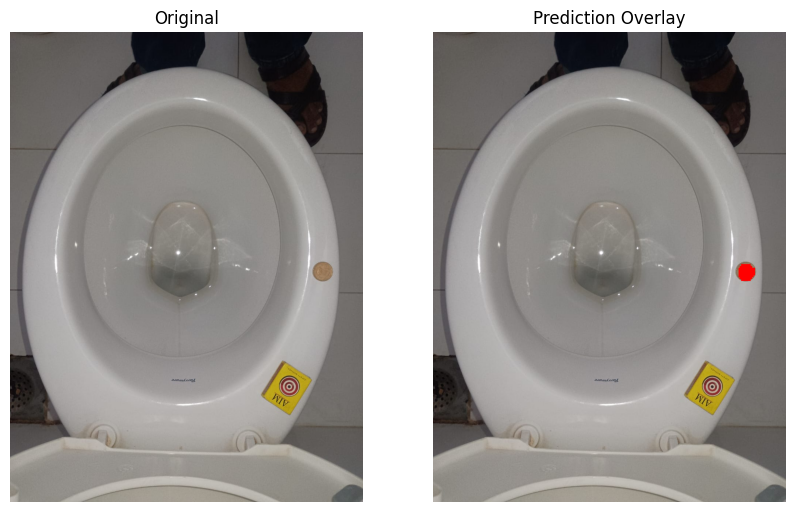

In [8]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms

# --- Setup device ---
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- Load and preprocess image ---
test_path = "./5_coin/test28.jpg"
test_image = cv2.imread(test_path)
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
resized = cv2.resize(test_image, (256, 256))

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])
input_tensor = transform(resized).unsqueeze(0).to(DEVICE)

# --- Predict ---
model.eval()
with torch.no_grad():
    output = model(input_tensor)
    pred = torch.sigmoid(output).squeeze().cpu().numpy()
    pred_mask = (pred > 0.5).astype(np.uint8) * 255

# --- Resize mask to original size ---
pred_mask_resized = cv2.resize(pred_mask, (test_image.shape[1], test_image.shape[0]))

# --- Overlay mask on image ---
overlay = test_image.copy()
overlay[pred_mask_resized == 255] = [255, 0, 0]

# --- Show results ---
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(test_image)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(overlay)
plt.title("Prediction Overlay")
plt.axis("off")
plt.show()


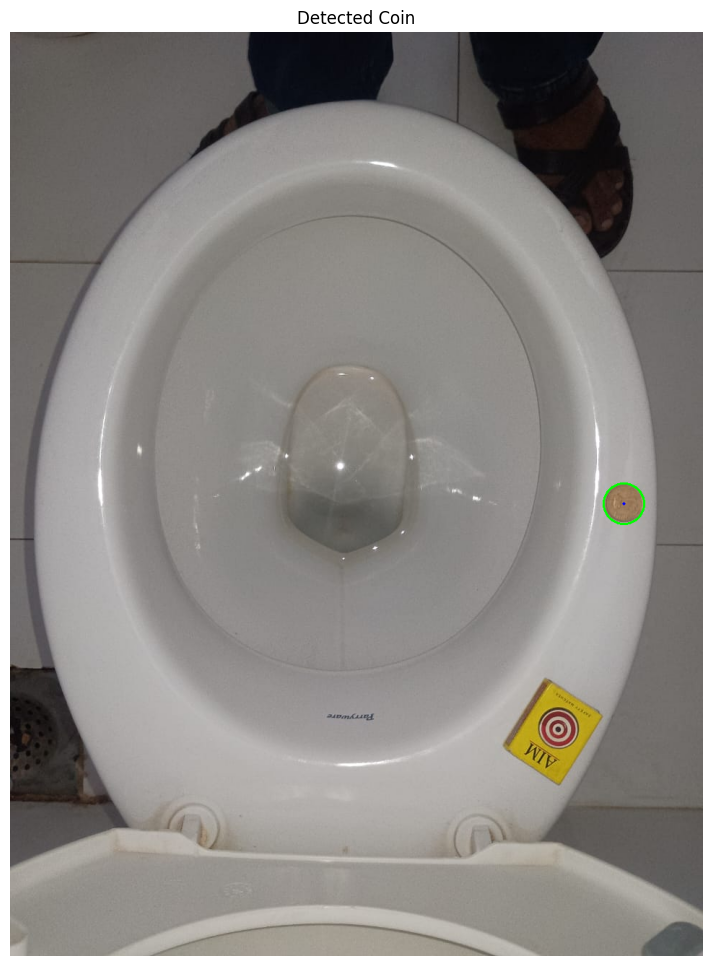

📏 Measured Properties
Pixel Radius: 28 px
Pixel Diameter: 56 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 61.88 px/in
Pixel per CM Ratio: 24.36 px/cm


In [14]:
# ========================
# Coin Circle Measurement
# ========================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

mask = pred_mask_resized

# Threshold if it's not binary
_, mask_bin = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

# Find contours
contours, _ = cv2.findContours(mask_bin, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Assume the largest contour is the coin
contour = max(contours, key=cv2.contourArea)

area = int(np.sum(mask_bin))

# Fit minimum enclosing circle
(x, y), radius = cv2.minEnclosingCircle(contour)
center = (int(x) - 1, int(y) - 1)
radius = int(radius)

# Draw result
output = test_image.copy()
cv2.circle(output, center, radius, (0, 255, 0), 2)
cv2.circle(output, center, 2, (0, 0, 255), -1)

# Show the result
plt.figure(figsize=(12,12))
plt.imshow(output)
plt.title("Detected Coin")
plt.axis("off")
plt.show()

# Convert pixel radius to real-world units
diameter_pixels = 2 * radius

# 🪙 INPUT: Real diameter of the coin in inches
real_coin_diameter_inch = 0.905  # You can change this for your coin
real_coin_diameter_cm = real_coin_diameter_inch * 2.54

# Calculate pixel-to-inch and pixel-to-cm ratio
pixel_per_inch = diameter_pixels / real_coin_diameter_inch
pixel_per_cm = diameter_pixels / real_coin_diameter_cm

# Output values
print("📏 Measured Properties")
print(f"Pixel Radius: {radius} px")
print(f"Pixel Diameter: {diameter_pixels} px")
print(f"Estimated Diameter (inches): {real_coin_diameter_inch:.3f} in")
print(f"Estimated Diameter (cm): {real_coin_diameter_cm:.3f} cm")
print(f"Pixel per Inch Ratio: {pixel_per_inch:.2f} px/in")
print(f"Pixel per CM Ratio: {pixel_per_cm:.2f} px/cm")


Processing test1.jpg


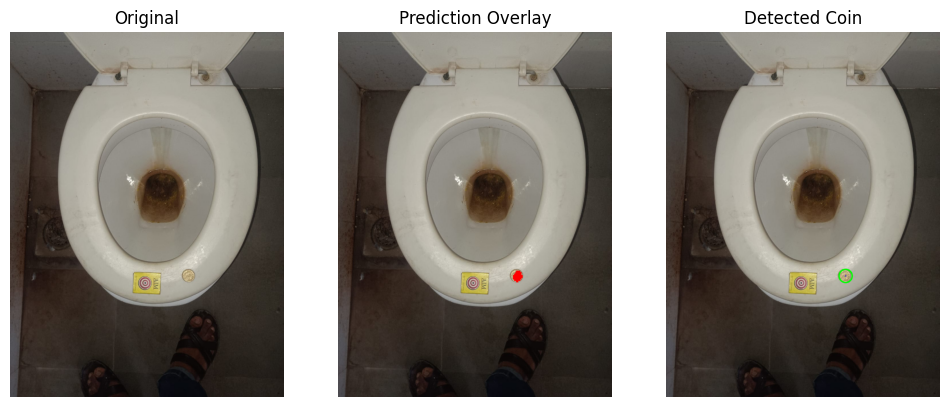

📏 Measured Properties
Pixel Radius: 23 px
Pixel Diameter: 46 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 50.83 px/in
Pixel per CM Ratio: 20.01 px/cm

Processing test10.jpg


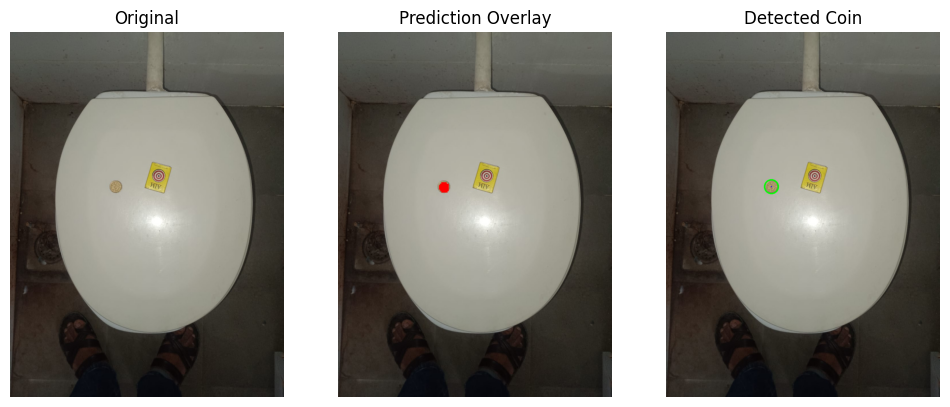

📏 Measured Properties
Pixel Radius: 24 px
Pixel Diameter: 48 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 53.04 px/in
Pixel per CM Ratio: 20.88 px/cm

Processing test11.jpg


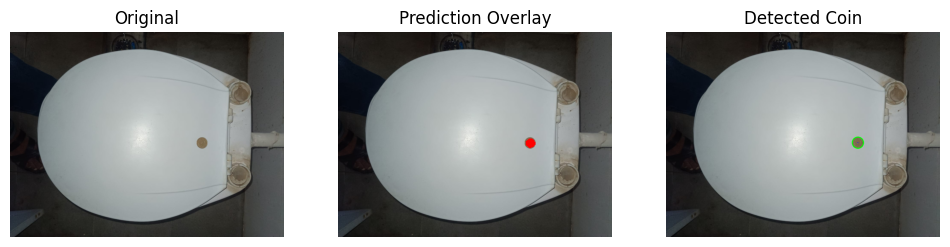

📏 Measured Properties
Pixel Radius: 26 px
Pixel Diameter: 52 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 57.46 px/in
Pixel per CM Ratio: 22.62 px/cm

Processing test12.jpg


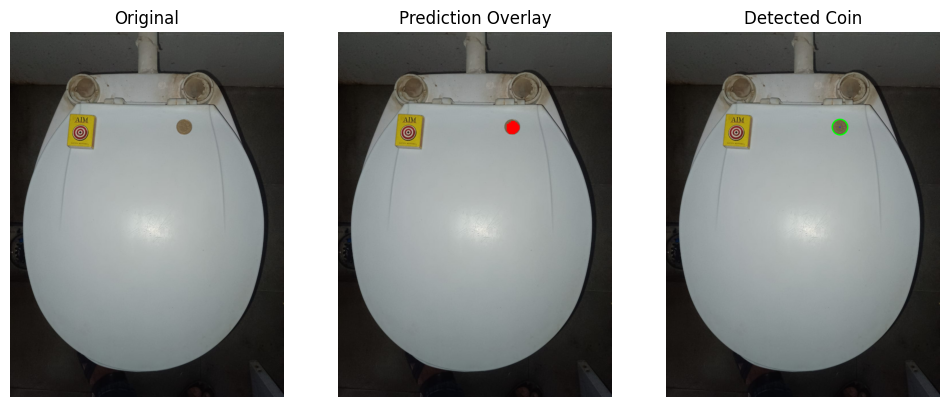

📏 Measured Properties
Pixel Radius: 27 px
Pixel Diameter: 54 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 59.67 px/in
Pixel per CM Ratio: 23.49 px/cm

Processing test13.jpg


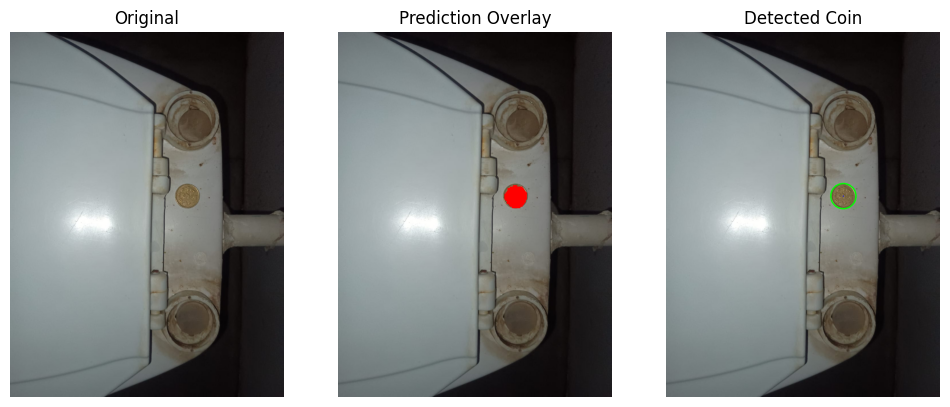

📏 Measured Properties
Pixel Radius: 44 px
Pixel Diameter: 88 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 97.24 px/in
Pixel per CM Ratio: 38.28 px/cm

Processing test14.jpg


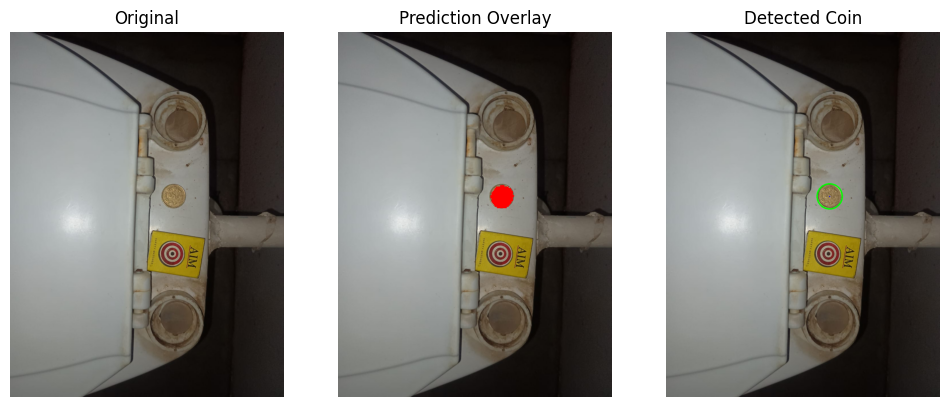

📏 Measured Properties
Pixel Radius: 44 px
Pixel Diameter: 88 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 97.24 px/in
Pixel per CM Ratio: 38.28 px/cm

Processing test15.jpg


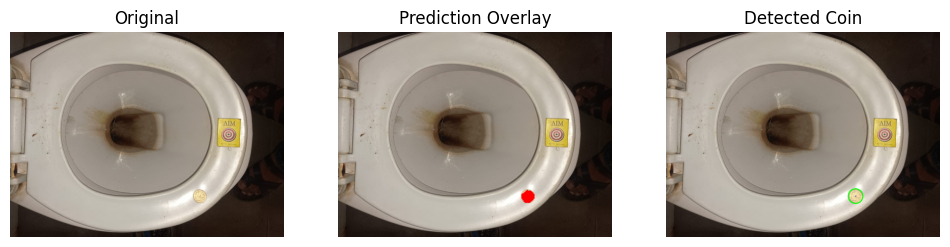

📏 Measured Properties
Pixel Radius: 34 px
Pixel Diameter: 68 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 75.14 px/in
Pixel per CM Ratio: 29.58 px/cm

Processing test16.jpg


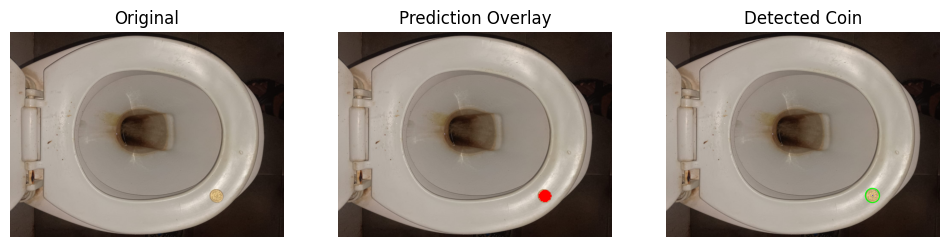

📏 Measured Properties
Pixel Radius: 33 px
Pixel Diameter: 66 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 72.93 px/in
Pixel per CM Ratio: 28.71 px/cm

Processing test17.jpg


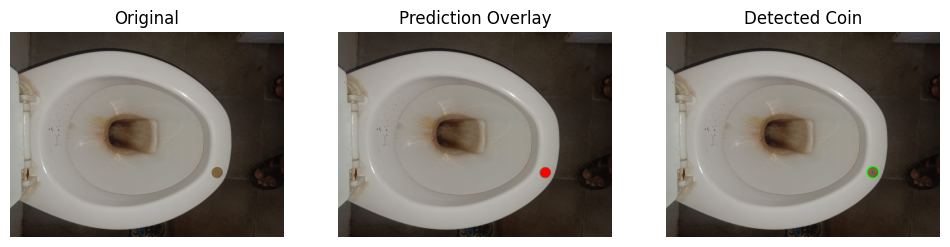

📏 Measured Properties
Pixel Radius: 27 px
Pixel Diameter: 54 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 59.67 px/in
Pixel per CM Ratio: 23.49 px/cm

Processing test18.jpg


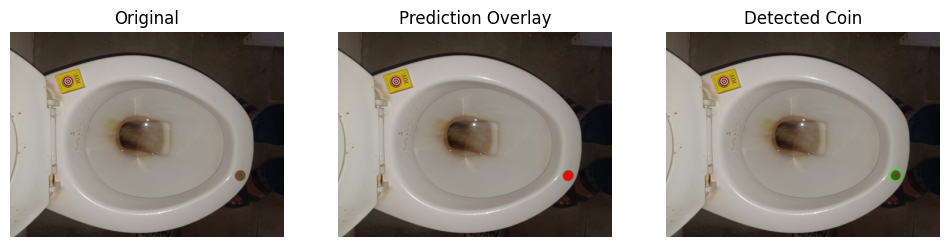

📏 Measured Properties
Pixel Radius: 26 px
Pixel Diameter: 52 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 57.46 px/in
Pixel per CM Ratio: 22.62 px/cm

Processing test19.jpg


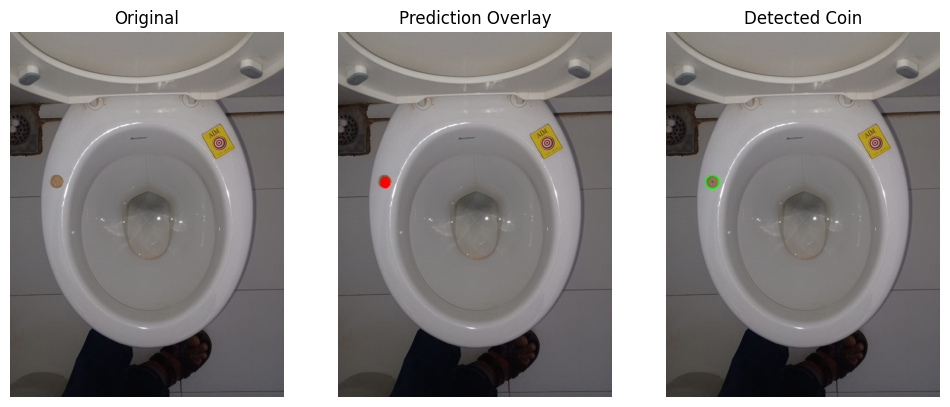

📏 Measured Properties
Pixel Radius: 23 px
Pixel Diameter: 46 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 50.83 px/in
Pixel per CM Ratio: 20.01 px/cm

Processing test2.jpg


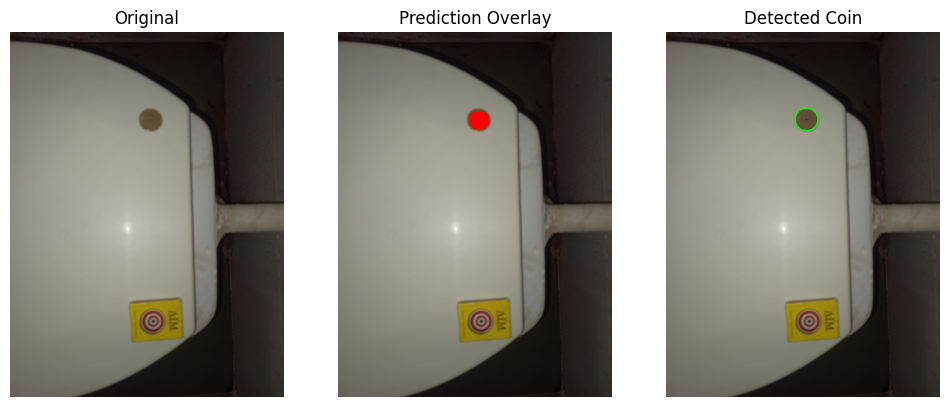

📏 Measured Properties
Pixel Radius: 40 px
Pixel Diameter: 80 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 88.40 px/in
Pixel per CM Ratio: 34.80 px/cm

Processing test20.jpg


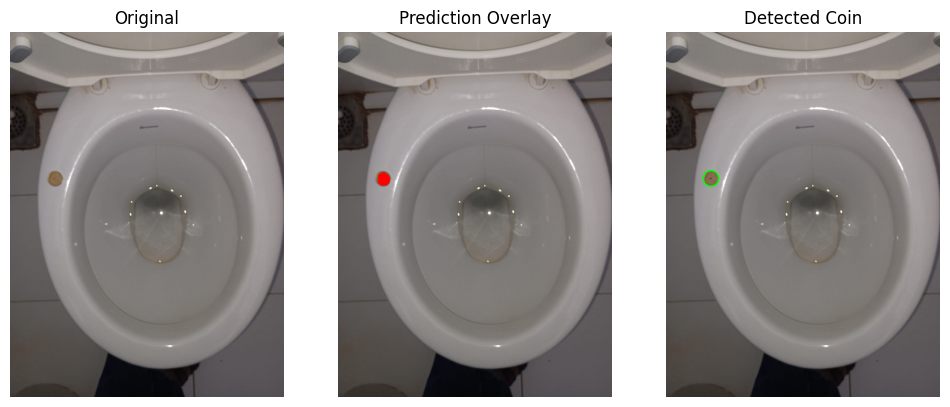

📏 Measured Properties
Pixel Radius: 27 px
Pixel Diameter: 54 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 59.67 px/in
Pixel per CM Ratio: 23.49 px/cm

Processing test21.jpg


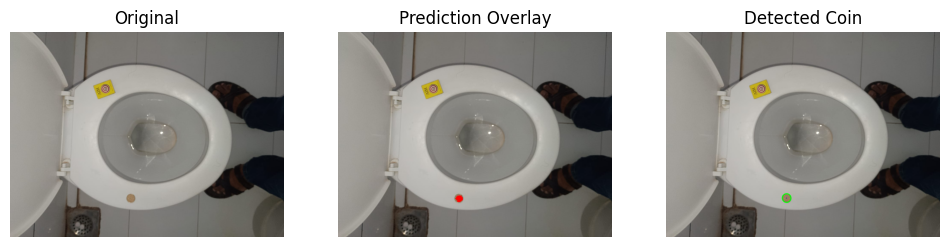

📏 Measured Properties
Pixel Radius: 20 px
Pixel Diameter: 40 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 44.20 px/in
Pixel per CM Ratio: 17.40 px/cm

Processing test22.jpg


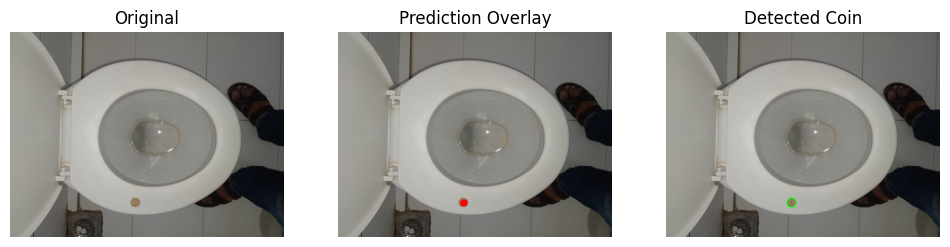

📏 Measured Properties
Pixel Radius: 21 px
Pixel Diameter: 42 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 46.41 px/in
Pixel per CM Ratio: 18.27 px/cm

Processing test23.jpg


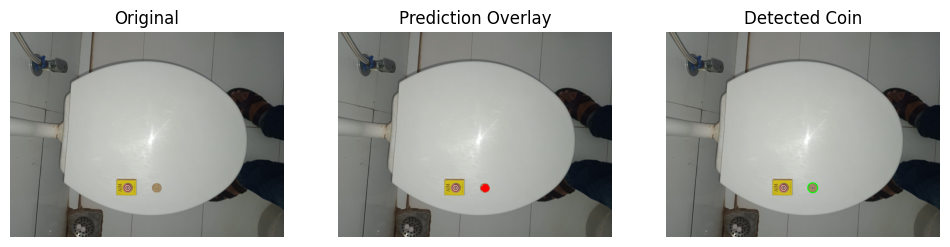

📏 Measured Properties
Pixel Radius: 23 px
Pixel Diameter: 46 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 50.83 px/in
Pixel per CM Ratio: 20.01 px/cm

Processing test24.jpg


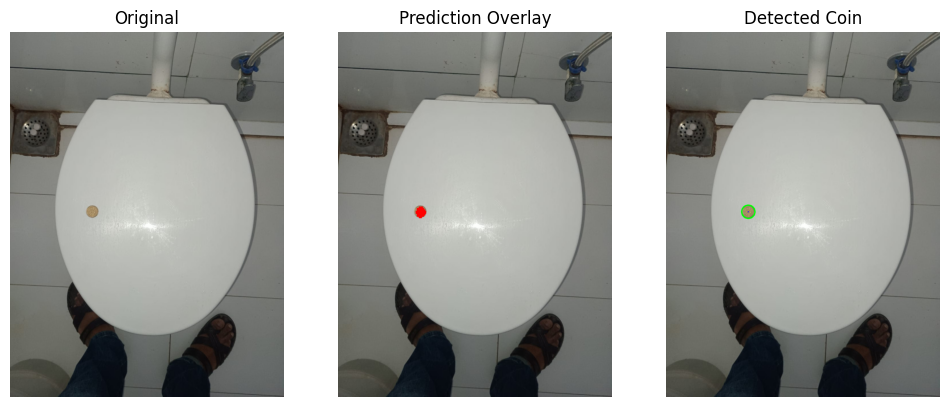

📏 Measured Properties
Pixel Radius: 23 px
Pixel Diameter: 46 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 50.83 px/in
Pixel per CM Ratio: 20.01 px/cm

Processing test25.jpg


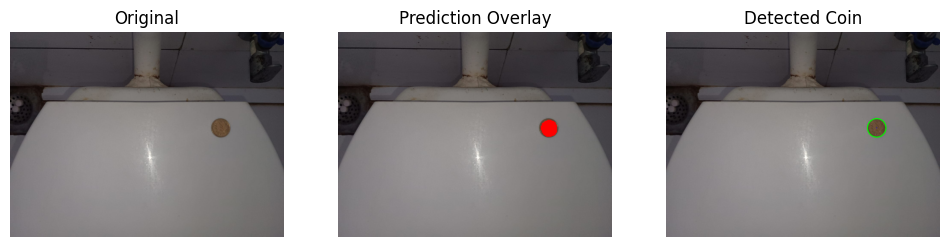

📏 Measured Properties
Pixel Radius: 43 px
Pixel Diameter: 86 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 95.03 px/in
Pixel per CM Ratio: 37.41 px/cm

Processing test26.jpg


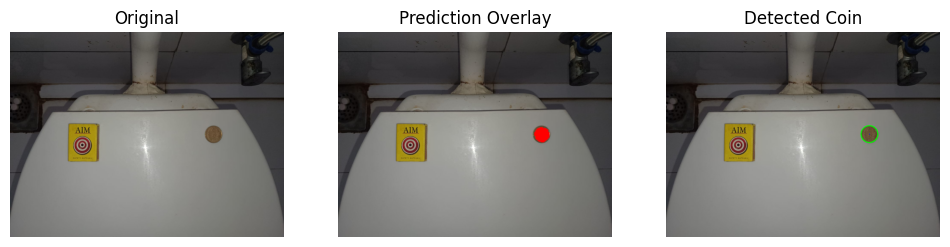

📏 Measured Properties
Pixel Radius: 39 px
Pixel Diameter: 78 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 86.19 px/in
Pixel per CM Ratio: 33.93 px/cm

Processing test27.jpg


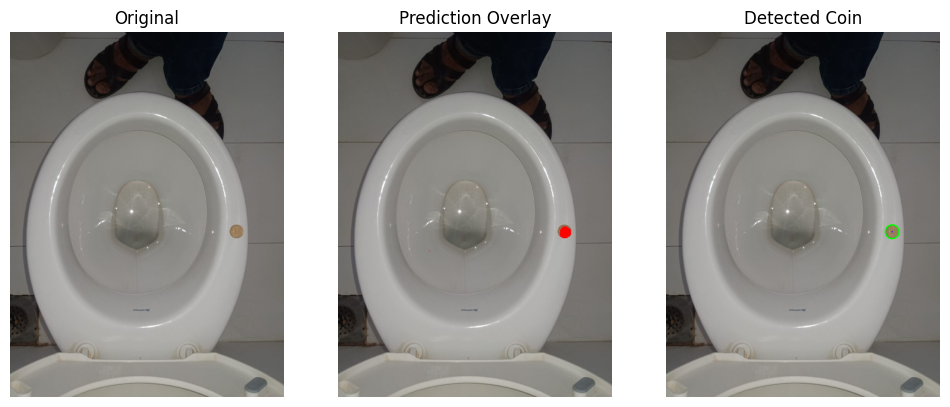

📏 Measured Properties
Pixel Radius: 24 px
Pixel Diameter: 48 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 53.04 px/in
Pixel per CM Ratio: 20.88 px/cm

Processing test28.jpg


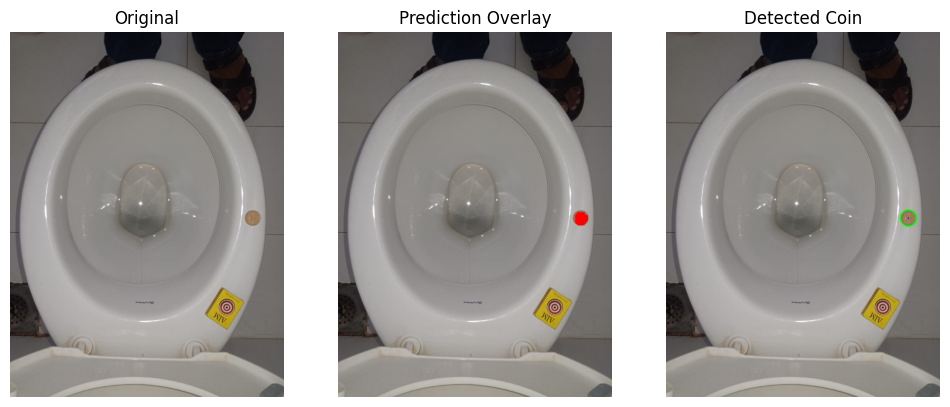

📏 Measured Properties
Pixel Radius: 28 px
Pixel Diameter: 56 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 61.88 px/in
Pixel per CM Ratio: 24.36 px/cm

Processing test29.jpg


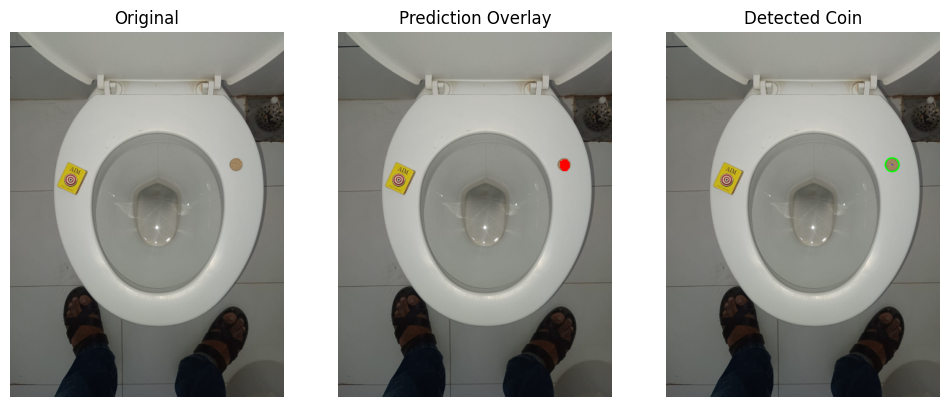

📏 Measured Properties
Pixel Radius: 24 px
Pixel Diameter: 48 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 53.04 px/in
Pixel per CM Ratio: 20.88 px/cm

Processing test3.jpg


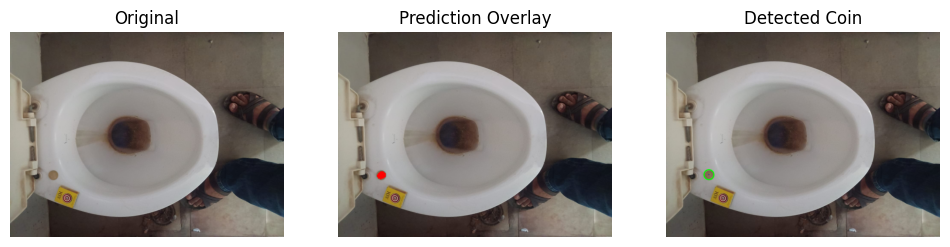

📏 Measured Properties
Pixel Radius: 23 px
Pixel Diameter: 46 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 50.83 px/in
Pixel per CM Ratio: 20.01 px/cm

Processing test30.jpg


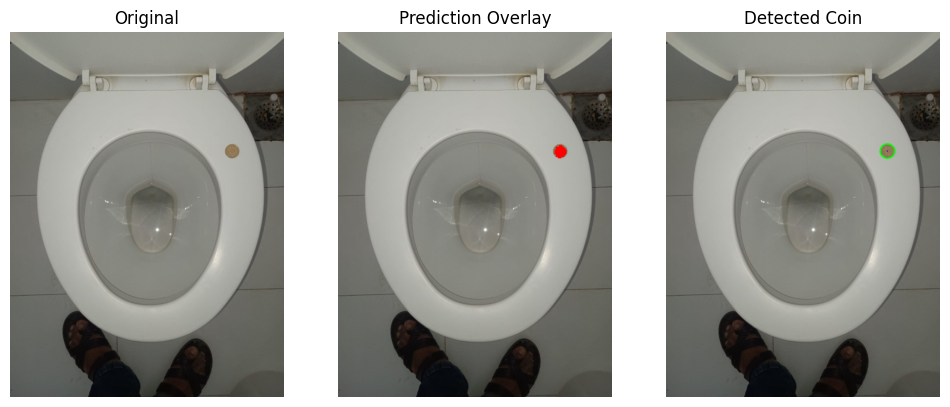

📏 Measured Properties
Pixel Radius: 25 px
Pixel Diameter: 50 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 55.25 px/in
Pixel per CM Ratio: 21.75 px/cm

Processing test31.jpg


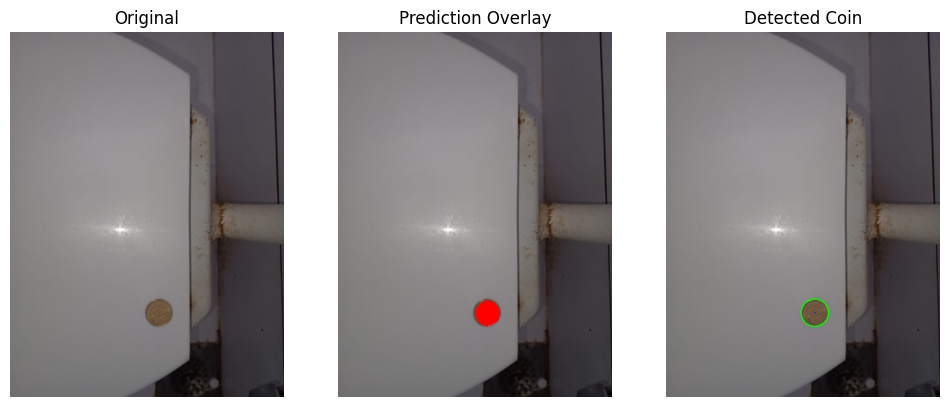

📏 Measured Properties
Pixel Radius: 48 px
Pixel Diameter: 96 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 106.08 px/in
Pixel per CM Ratio: 41.76 px/cm

Processing test32.jpg


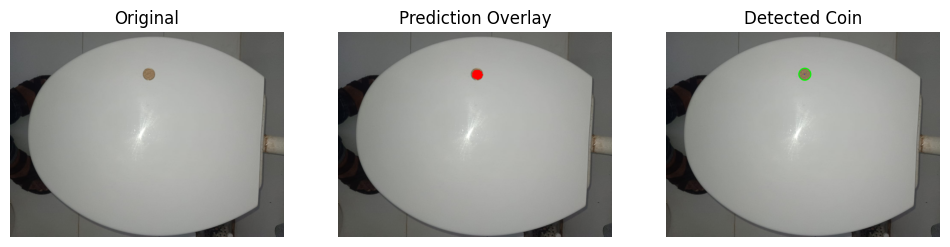

📏 Measured Properties
Pixel Radius: 28 px
Pixel Diameter: 56 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 61.88 px/in
Pixel per CM Ratio: 24.36 px/cm

Processing test33.jpg


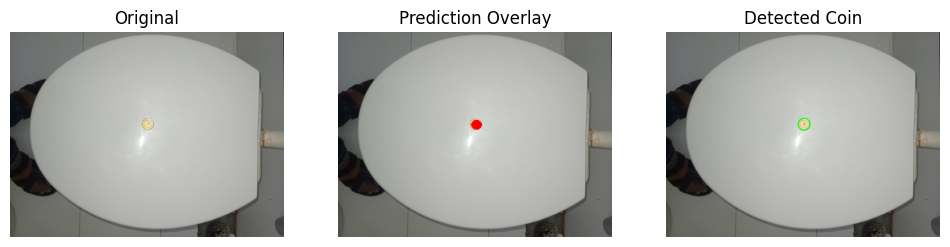

📏 Measured Properties
Pixel Radius: 28 px
Pixel Diameter: 56 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 61.88 px/in
Pixel per CM Ratio: 24.36 px/cm

Processing test34.jpg


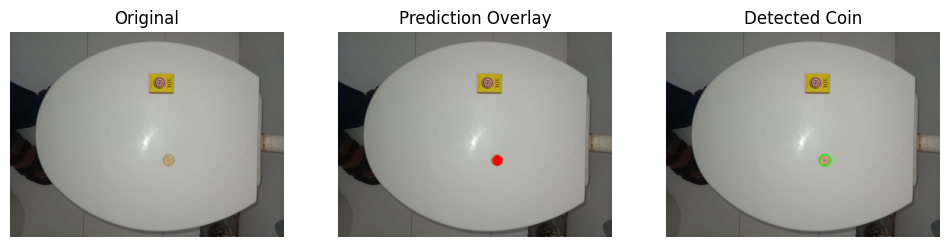

📏 Measured Properties
Pixel Radius: 28 px
Pixel Diameter: 56 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 61.88 px/in
Pixel per CM Ratio: 24.36 px/cm

Processing test35.jpg


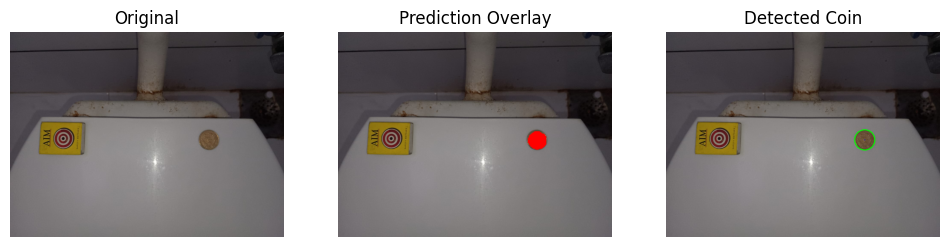

📏 Measured Properties
Pixel Radius: 47 px
Pixel Diameter: 94 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 103.87 px/in
Pixel per CM Ratio: 40.89 px/cm

Processing test36.jpg


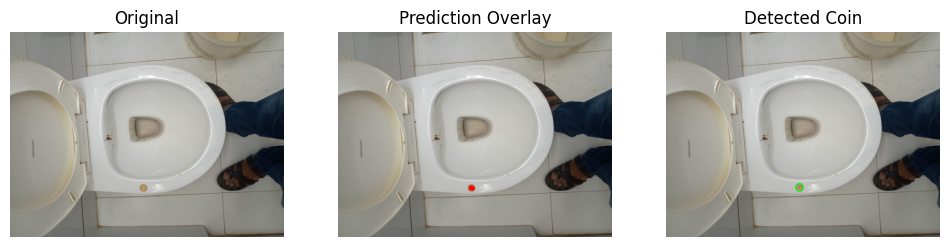

📏 Measured Properties
Pixel Radius: 18 px
Pixel Diameter: 36 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 39.78 px/in
Pixel per CM Ratio: 15.66 px/cm

Processing test37.jpg


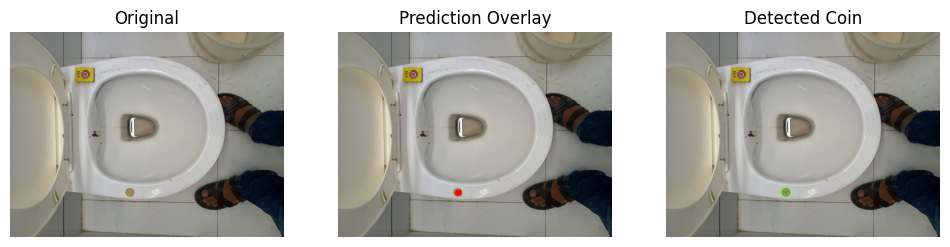

📏 Measured Properties
Pixel Radius: 19 px
Pixel Diameter: 38 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 41.99 px/in
Pixel per CM Ratio: 16.53 px/cm

Processing test38.jpg


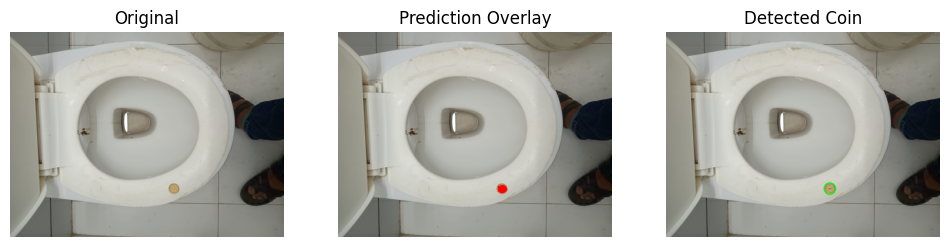

📏 Measured Properties
Pixel Radius: 27 px
Pixel Diameter: 54 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 59.67 px/in
Pixel per CM Ratio: 23.49 px/cm

Processing test39.jpg


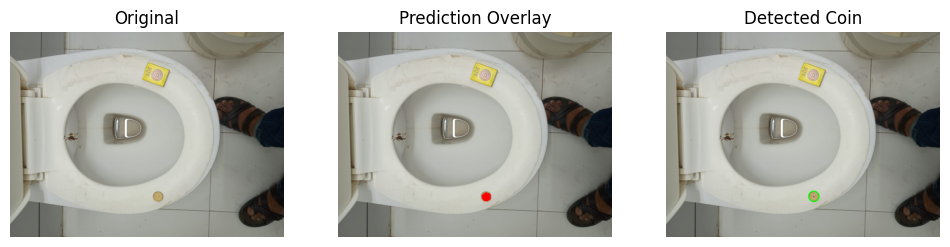

📏 Measured Properties
Pixel Radius: 24 px
Pixel Diameter: 48 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 53.04 px/in
Pixel per CM Ratio: 20.88 px/cm

Processing test4.jpg


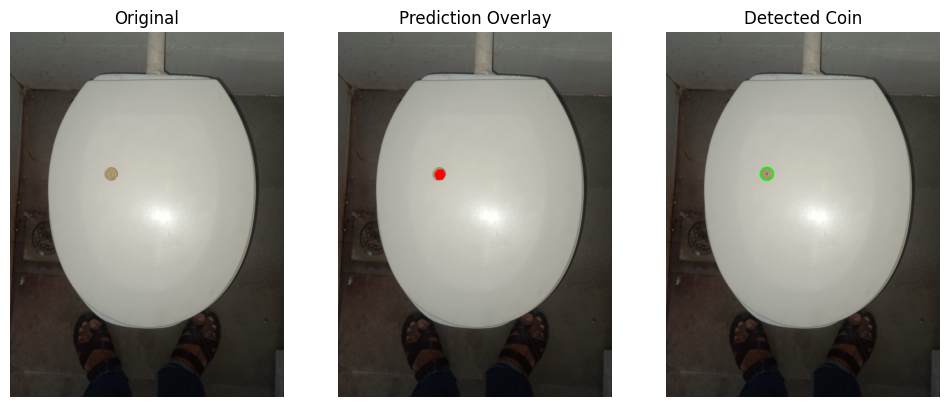

📏 Measured Properties
Pixel Radius: 23 px
Pixel Diameter: 46 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 50.83 px/in
Pixel per CM Ratio: 20.01 px/cm

Processing test40.jpg


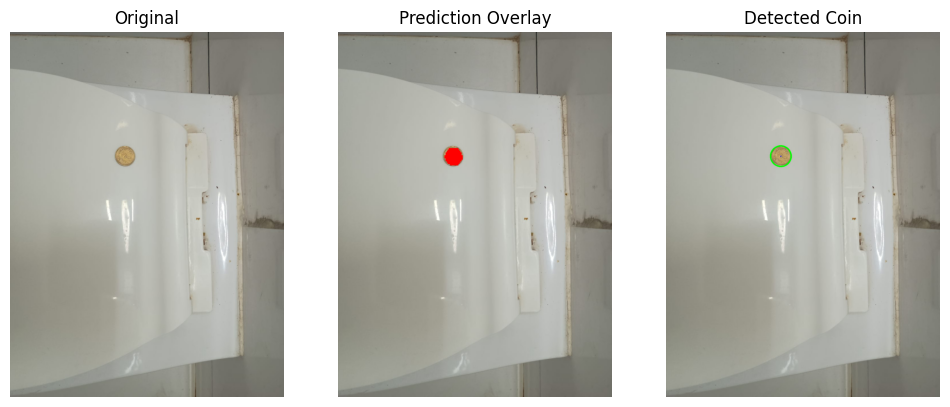

📏 Measured Properties
Pixel Radius: 36 px
Pixel Diameter: 72 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 79.56 px/in
Pixel per CM Ratio: 31.32 px/cm

Processing test41.jpg


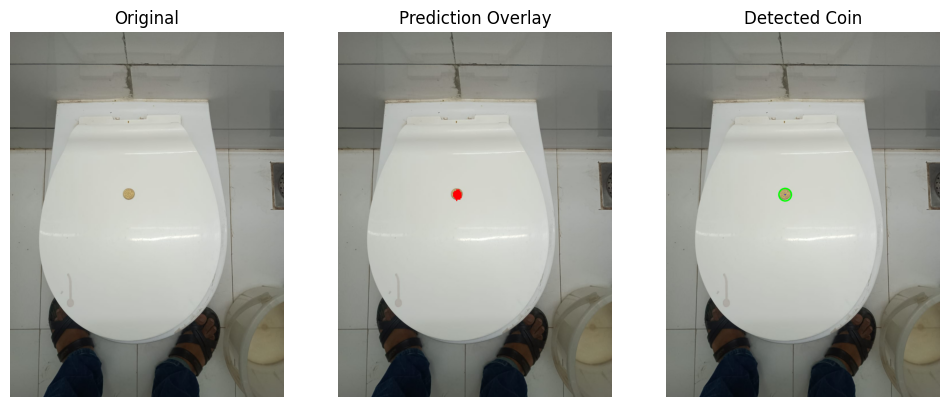

📏 Measured Properties
Pixel Radius: 22 px
Pixel Diameter: 44 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 48.62 px/in
Pixel per CM Ratio: 19.14 px/cm

Processing test42.jpg


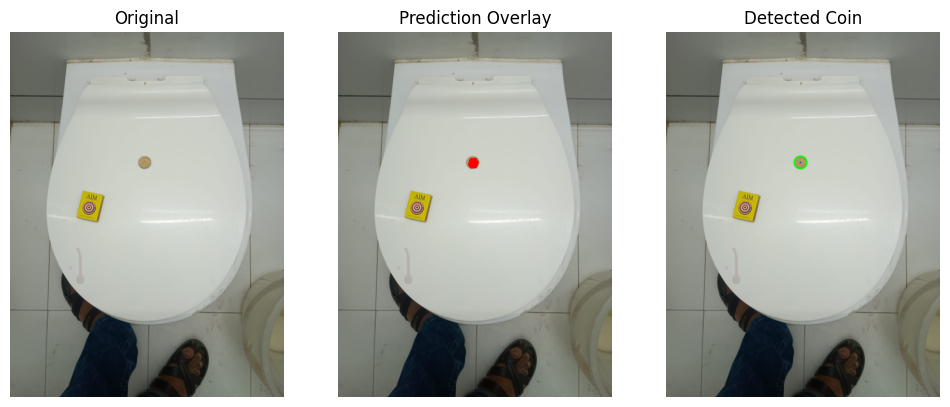

📏 Measured Properties
Pixel Radius: 22 px
Pixel Diameter: 44 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 48.62 px/in
Pixel per CM Ratio: 19.14 px/cm

Processing test43.jpg


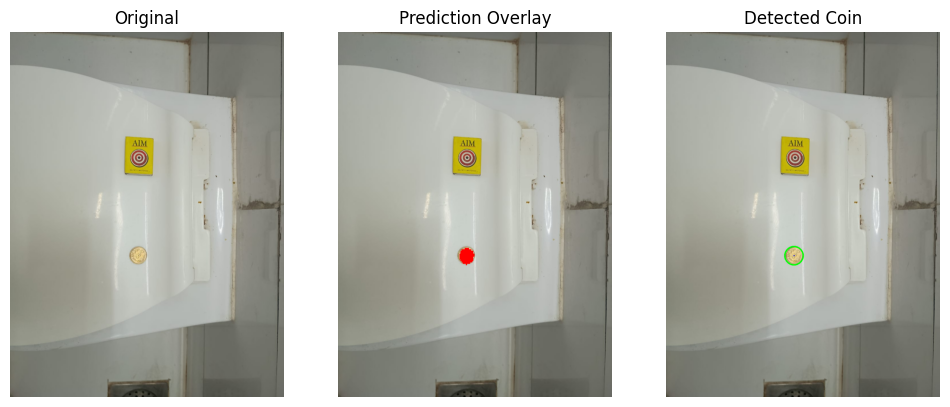

📏 Measured Properties
Pixel Radius: 32 px
Pixel Diameter: 64 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 70.72 px/in
Pixel per CM Ratio: 27.84 px/cm

Processing test44.jpg


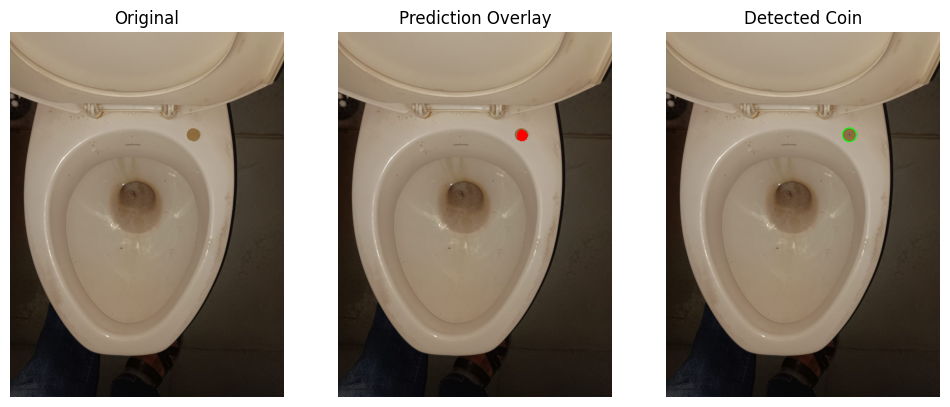

📏 Measured Properties
Pixel Radius: 30 px
Pixel Diameter: 60 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 66.30 px/in
Pixel per CM Ratio: 26.10 px/cm

Processing test45.jpg


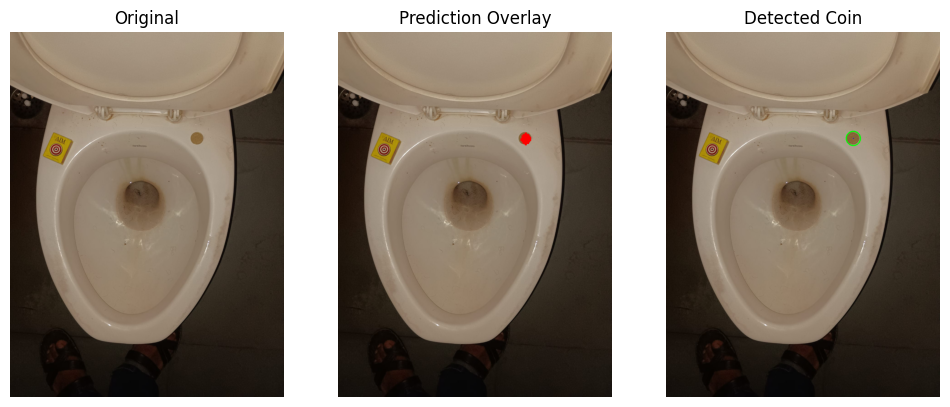

📏 Measured Properties
Pixel Radius: 31 px
Pixel Diameter: 62 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 68.51 px/in
Pixel per CM Ratio: 26.97 px/cm

Processing test46.jpg


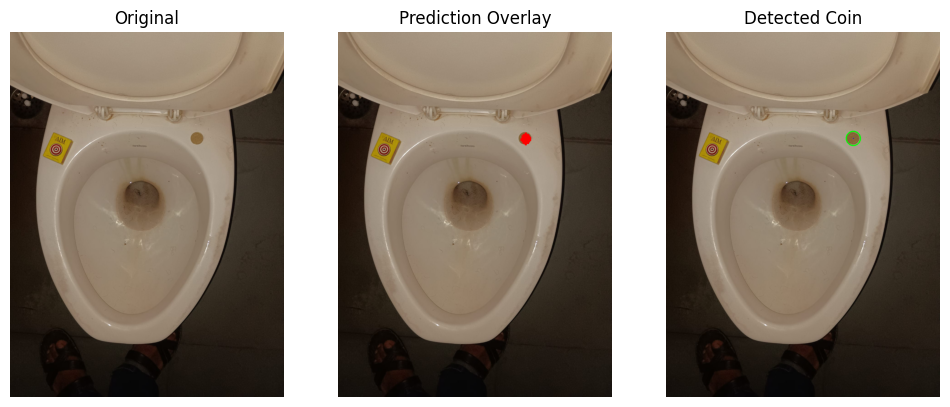

📏 Measured Properties
Pixel Radius: 31 px
Pixel Diameter: 62 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 68.51 px/in
Pixel per CM Ratio: 26.97 px/cm

Processing test47.jpg


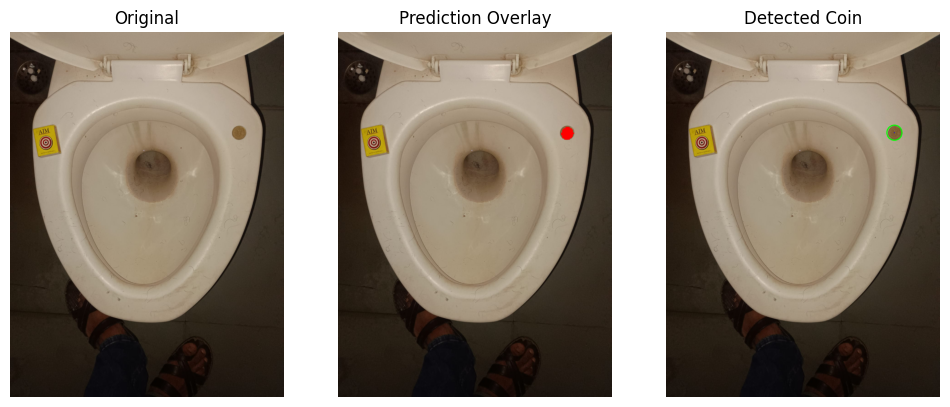

📏 Measured Properties
Pixel Radius: 33 px
Pixel Diameter: 66 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 72.93 px/in
Pixel per CM Ratio: 28.71 px/cm

Processing test48.jpg


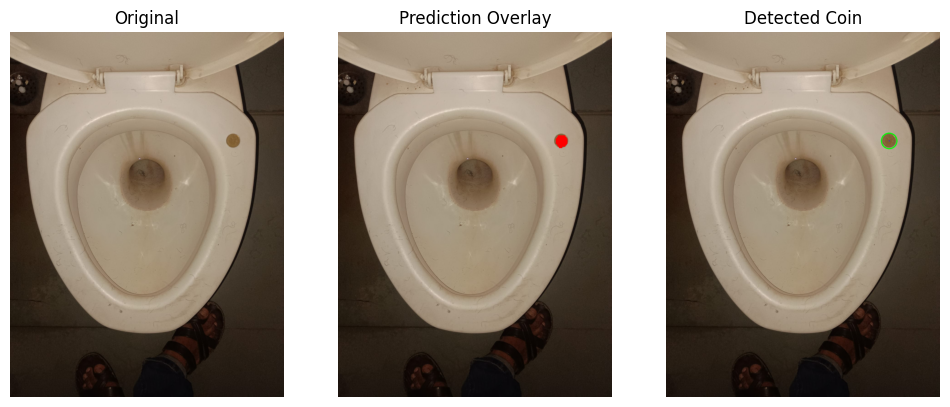

📏 Measured Properties
Pixel Radius: 34 px
Pixel Diameter: 68 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 75.14 px/in
Pixel per CM Ratio: 29.58 px/cm

Processing test49.jpg


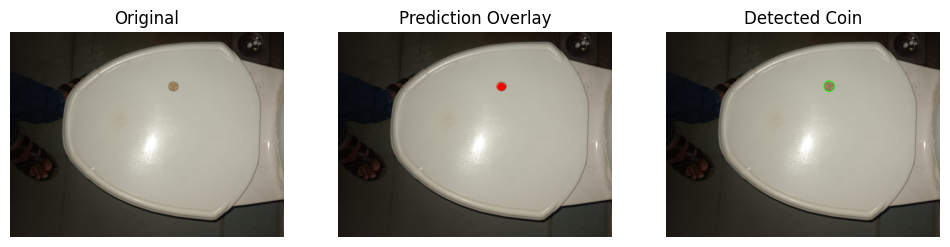

📏 Measured Properties
Pixel Radius: 31 px
Pixel Diameter: 62 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 68.51 px/in
Pixel per CM Ratio: 26.97 px/cm

Processing test5.jpg


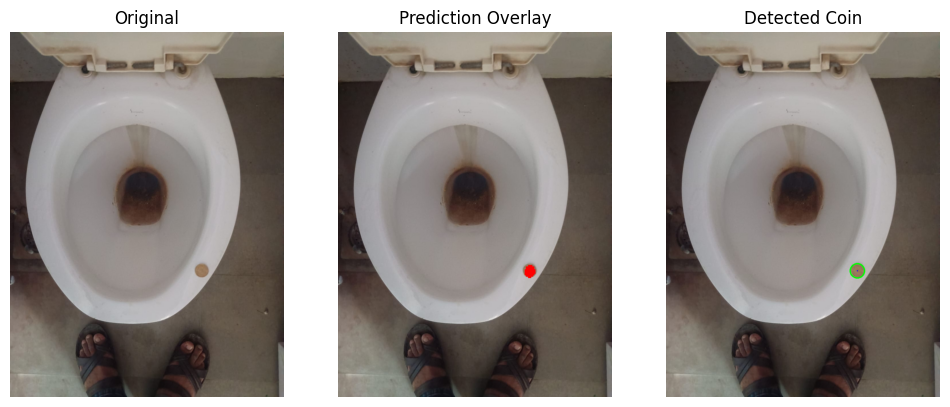

📏 Measured Properties
Pixel Radius: 25 px
Pixel Diameter: 50 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 55.25 px/in
Pixel per CM Ratio: 21.75 px/cm

Processing test50.jpg


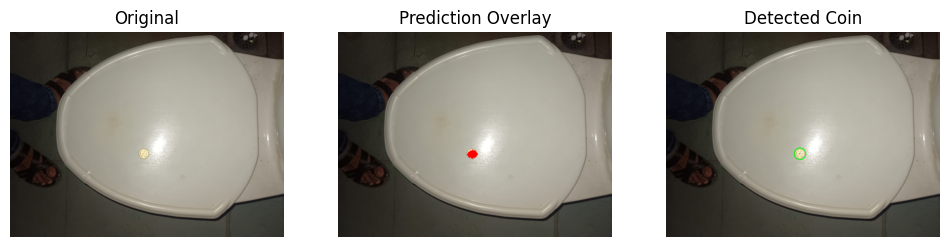

📏 Measured Properties
Pixel Radius: 34 px
Pixel Diameter: 68 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 75.14 px/in
Pixel per CM Ratio: 29.58 px/cm

Processing test51.jpg


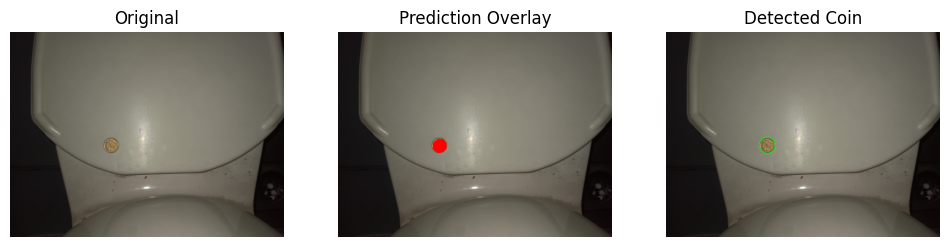

📏 Measured Properties
Pixel Radius: 47 px
Pixel Diameter: 94 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 103.87 px/in
Pixel per CM Ratio: 40.89 px/cm

Processing test52.jpg


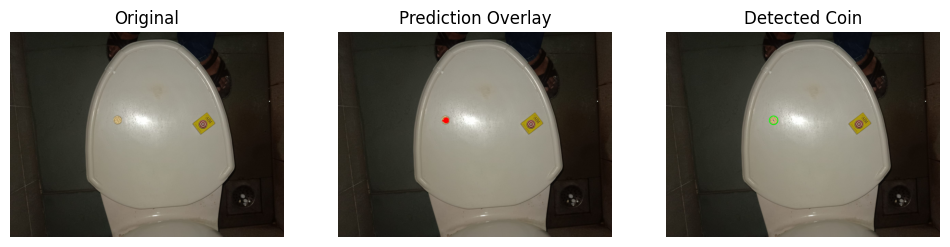

📏 Measured Properties
Pixel Radius: 25 px
Pixel Diameter: 50 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 55.25 px/in
Pixel per CM Ratio: 21.75 px/cm

Processing test53.jpg


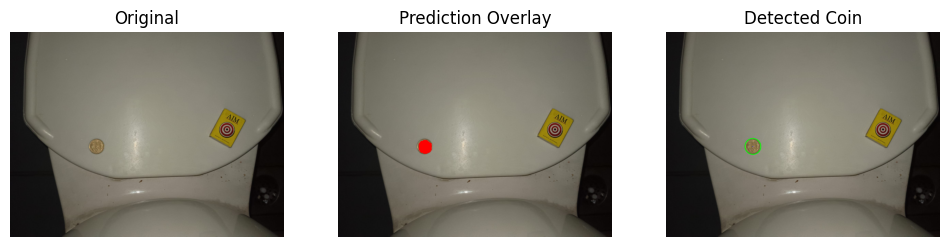

📏 Measured Properties
Pixel Radius: 46 px
Pixel Diameter: 92 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 101.66 px/in
Pixel per CM Ratio: 40.02 px/cm

Processing test54.jpg


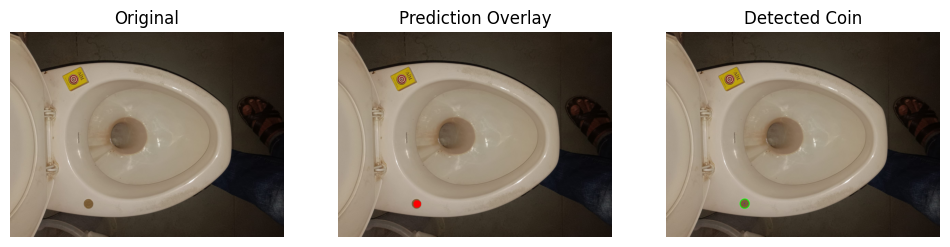

📏 Measured Properties
Pixel Radius: 27 px
Pixel Diameter: 54 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 59.67 px/in
Pixel per CM Ratio: 23.49 px/cm

Processing test55.jpg


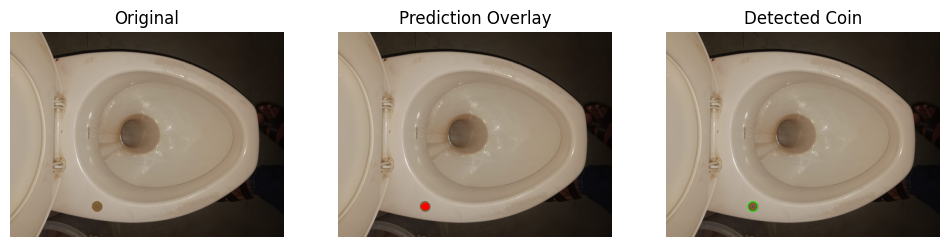

📏 Measured Properties
Pixel Radius: 29 px
Pixel Diameter: 58 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 64.09 px/in
Pixel per CM Ratio: 25.23 px/cm

Processing test56.jpg


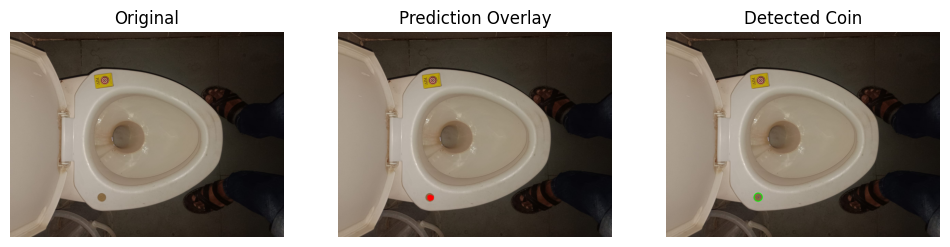

📏 Measured Properties
Pixel Radius: 24 px
Pixel Diameter: 48 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 53.04 px/in
Pixel per CM Ratio: 20.88 px/cm

Processing test57.jpg


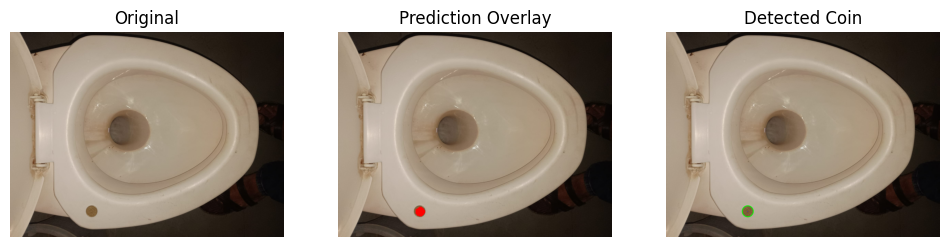

📏 Measured Properties
Pixel Radius: 32 px
Pixel Diameter: 64 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 70.72 px/in
Pixel per CM Ratio: 27.84 px/cm

Processing test58.jpg


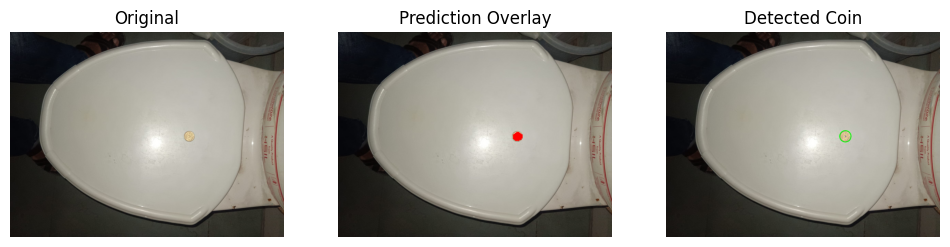

📏 Measured Properties
Pixel Radius: 33 px
Pixel Diameter: 66 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 72.93 px/in
Pixel per CM Ratio: 28.71 px/cm

Processing test59.jpg


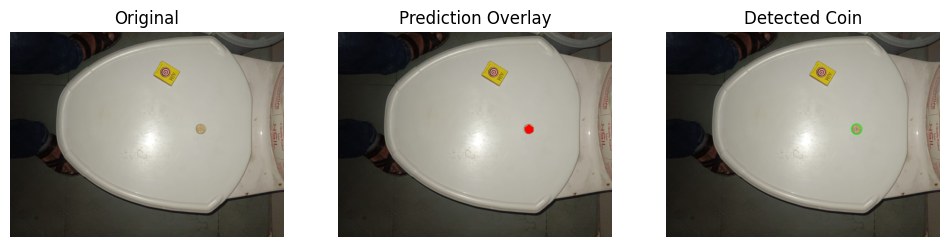

📏 Measured Properties
Pixel Radius: 31 px
Pixel Diameter: 62 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 68.51 px/in
Pixel per CM Ratio: 26.97 px/cm

Processing test6.jpg


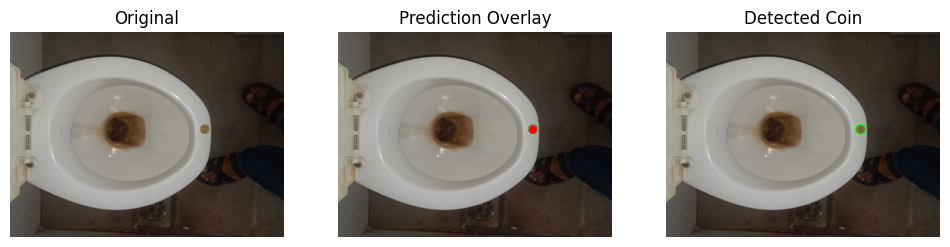

📏 Measured Properties
Pixel Radius: 22 px
Pixel Diameter: 44 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 48.62 px/in
Pixel per CM Ratio: 19.14 px/cm

Processing test60.jpg


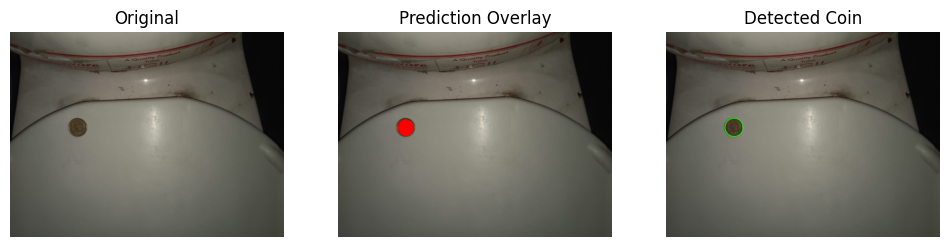

📏 Measured Properties
Pixel Radius: 53 px
Pixel Diameter: 106 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 117.13 px/in
Pixel per CM Ratio: 46.11 px/cm

Processing test61.jpg


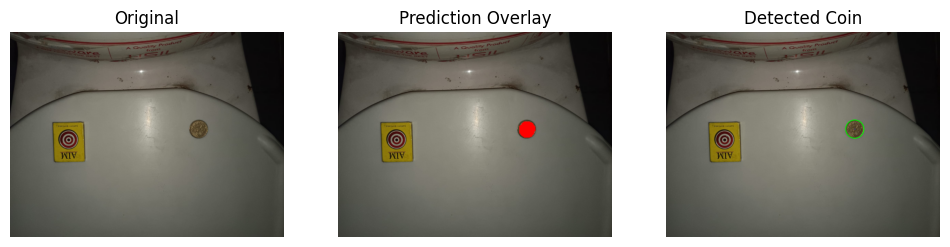

📏 Measured Properties
Pixel Radius: 53 px
Pixel Diameter: 106 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 117.13 px/in
Pixel per CM Ratio: 46.11 px/cm

Processing test62.jpg


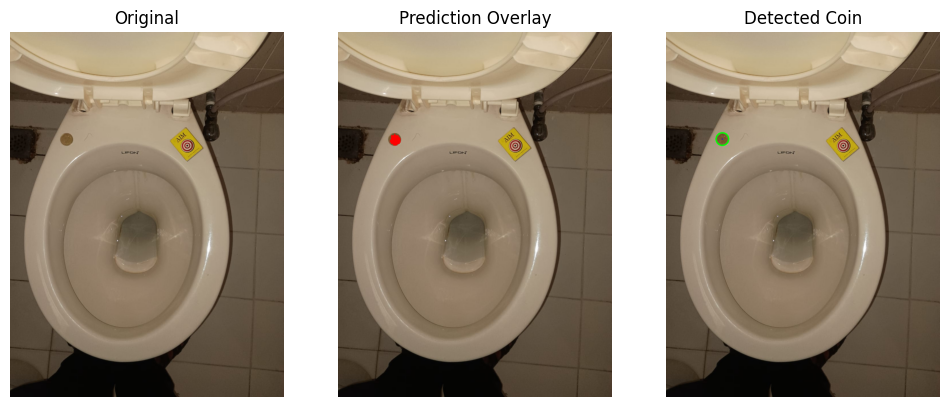

📏 Measured Properties
Pixel Radius: 22 px
Pixel Diameter: 44 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 48.62 px/in
Pixel per CM Ratio: 19.14 px/cm

Processing test63.jpg


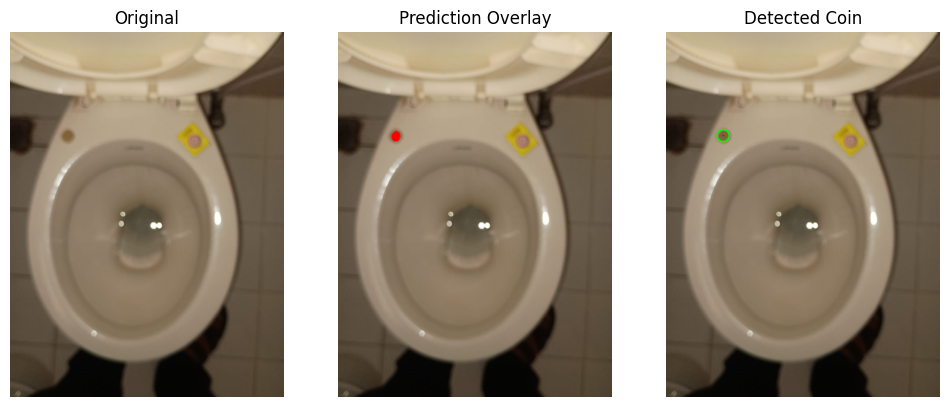

📏 Measured Properties
Pixel Radius: 21 px
Pixel Diameter: 42 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 46.41 px/in
Pixel per CM Ratio: 18.27 px/cm

Processing test64.jpg


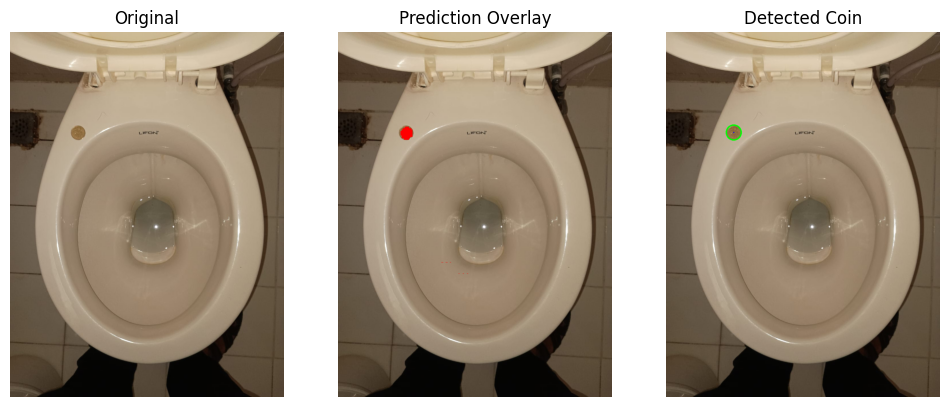

📏 Measured Properties
Pixel Radius: 26 px
Pixel Diameter: 52 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 57.46 px/in
Pixel per CM Ratio: 22.62 px/cm

Processing test65.jpg


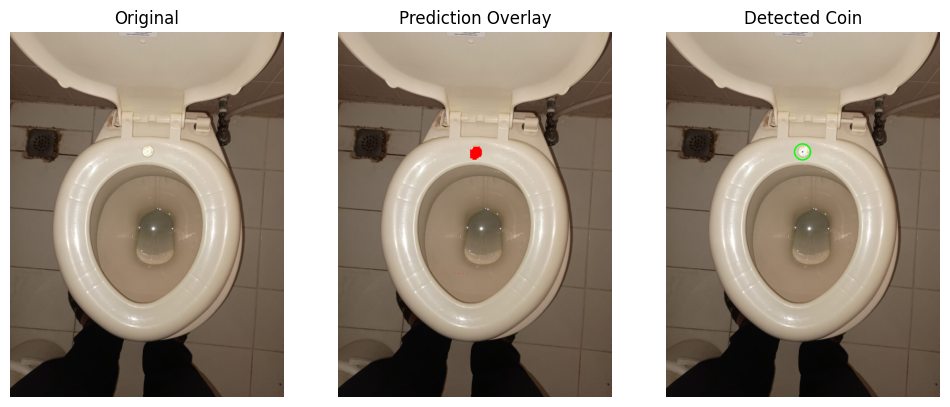

📏 Measured Properties
Pixel Radius: 28 px
Pixel Diameter: 56 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 61.88 px/in
Pixel per CM Ratio: 24.36 px/cm

Processing test66.jpg


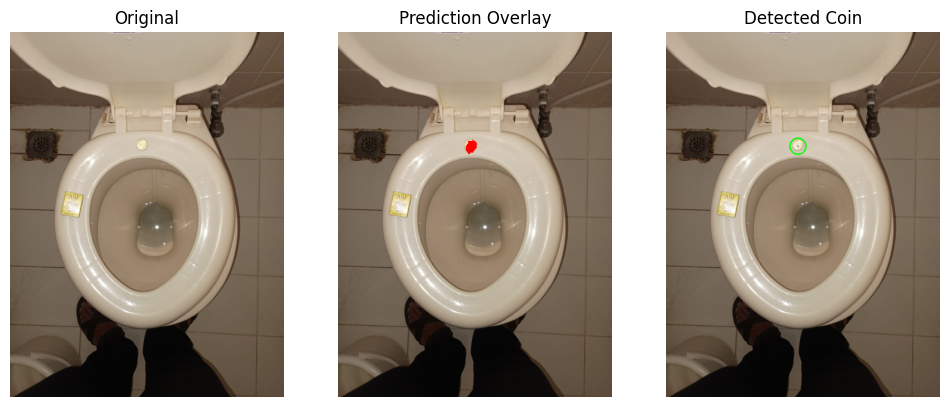

📏 Measured Properties
Pixel Radius: 28 px
Pixel Diameter: 56 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 61.88 px/in
Pixel per CM Ratio: 24.36 px/cm

Processing test67.jpg


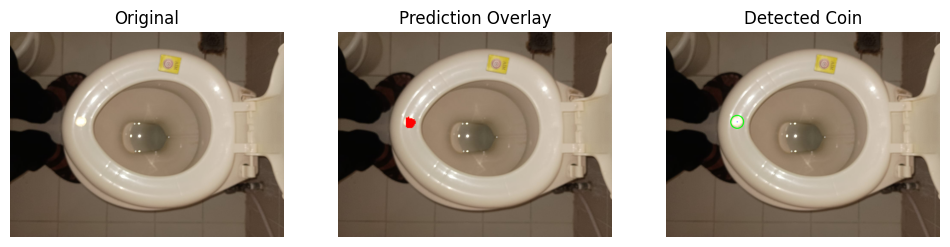

📏 Measured Properties
Pixel Radius: 30 px
Pixel Diameter: 60 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 66.30 px/in
Pixel per CM Ratio: 26.10 px/cm

Processing test68.jpg


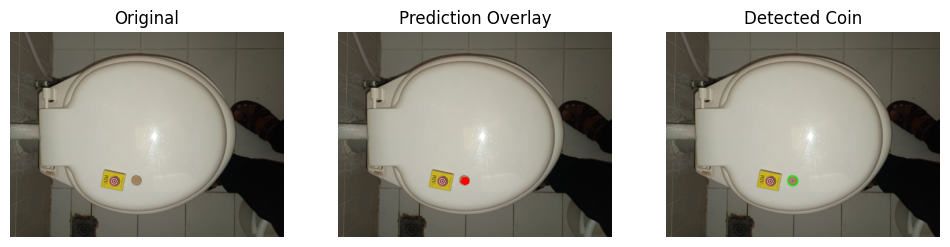

📏 Measured Properties
Pixel Radius: 24 px
Pixel Diameter: 48 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 53.04 px/in
Pixel per CM Ratio: 20.88 px/cm

Processing test69.jpg


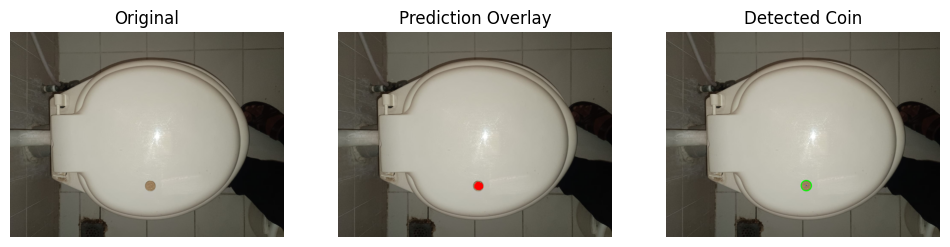

📏 Measured Properties
Pixel Radius: 24 px
Pixel Diameter: 48 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 53.04 px/in
Pixel per CM Ratio: 20.88 px/cm

Processing test7.jpg


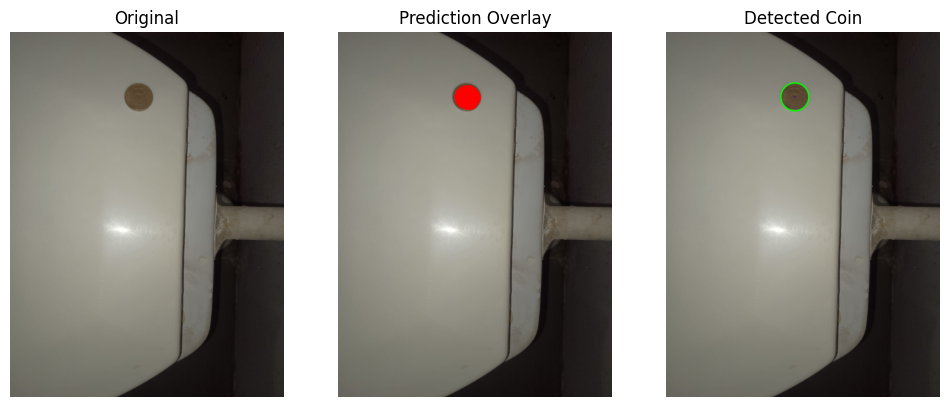

📏 Measured Properties
Pixel Radius: 49 px
Pixel Diameter: 98 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 108.29 px/in
Pixel per CM Ratio: 42.63 px/cm

Processing test70.jpg


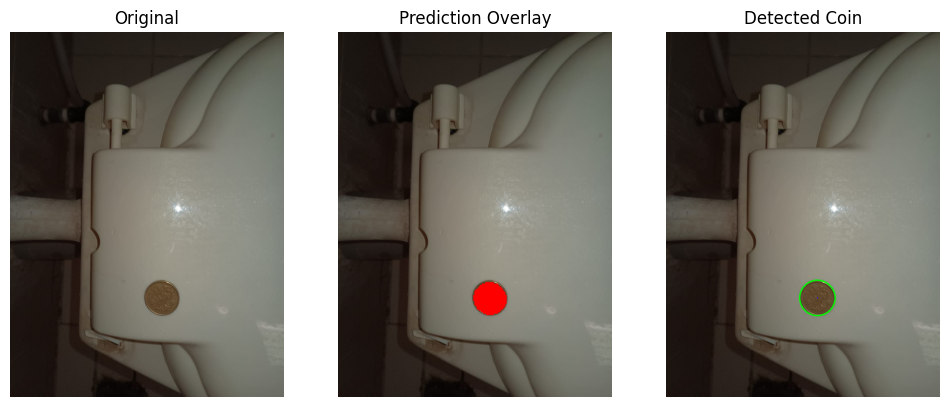

📏 Measured Properties
Pixel Radius: 62 px
Pixel Diameter: 124 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 137.02 px/in
Pixel per CM Ratio: 53.94 px/cm

Processing test71.jpg


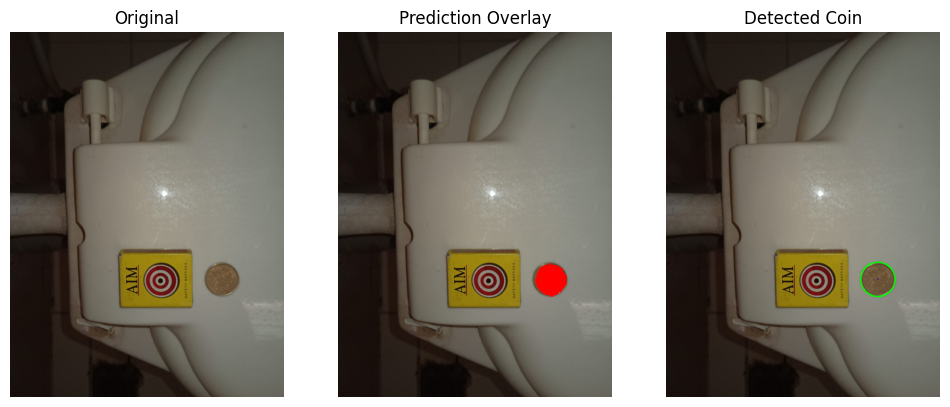

📏 Measured Properties
Pixel Radius: 60 px
Pixel Diameter: 120 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 132.60 px/in
Pixel per CM Ratio: 52.20 px/cm

Processing test72.jpg


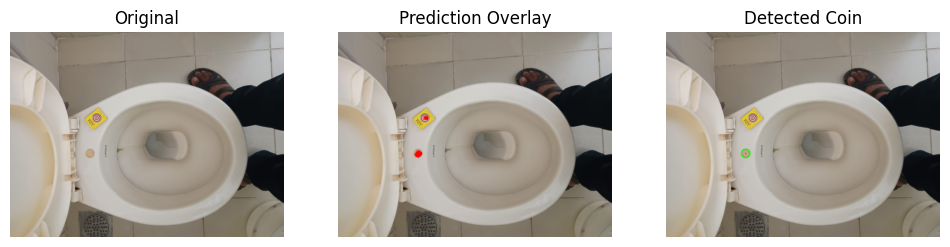

📏 Measured Properties
Pixel Radius: 20 px
Pixel Diameter: 40 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 44.20 px/in
Pixel per CM Ratio: 17.40 px/cm

Processing test73.jpg


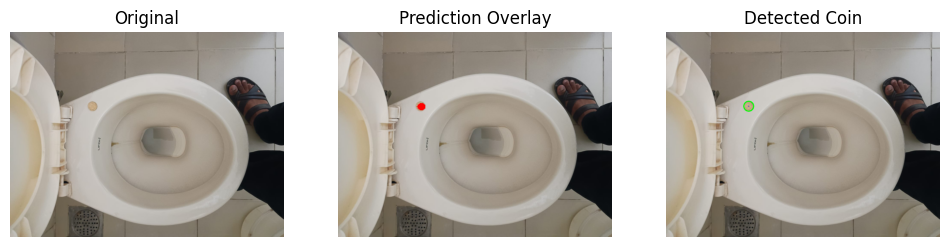

📏 Measured Properties
Pixel Radius: 23 px
Pixel Diameter: 46 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 50.83 px/in
Pixel per CM Ratio: 20.01 px/cm

Processing test74.jpg


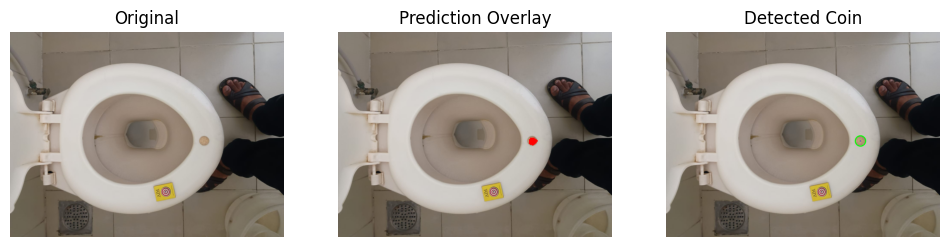

📏 Measured Properties
Pixel Radius: 24 px
Pixel Diameter: 48 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 53.04 px/in
Pixel per CM Ratio: 20.88 px/cm

Processing test75.jpg


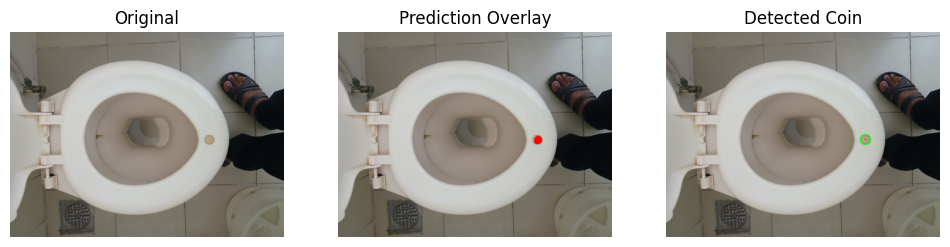

📏 Measured Properties
Pixel Radius: 23 px
Pixel Diameter: 46 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 50.83 px/in
Pixel per CM Ratio: 20.01 px/cm

Processing test76.jpg


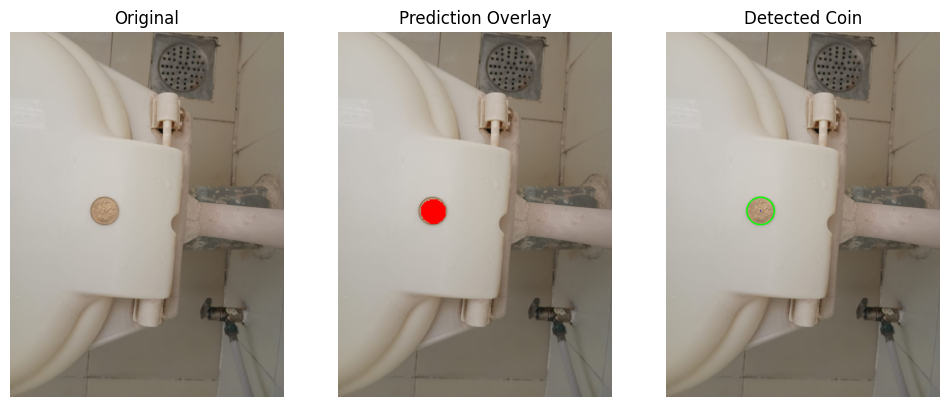

📏 Measured Properties
Pixel Radius: 48 px
Pixel Diameter: 96 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 106.08 px/in
Pixel per CM Ratio: 41.76 px/cm

Processing test77.jpg


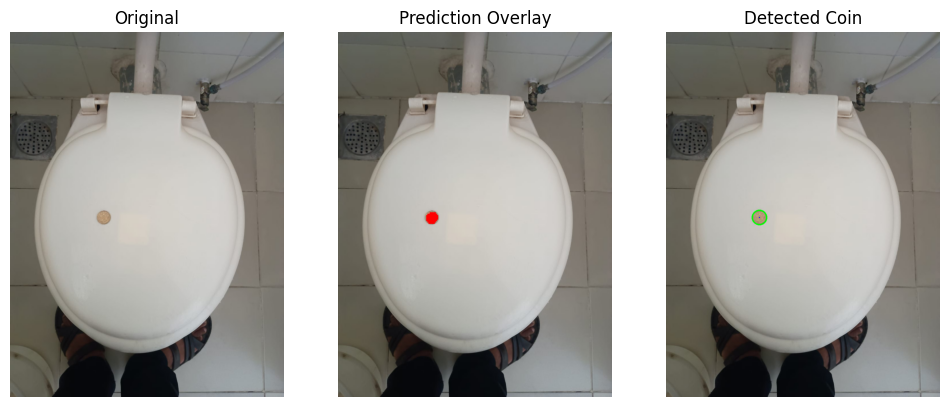

📏 Measured Properties
Pixel Radius: 25 px
Pixel Diameter: 50 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 55.25 px/in
Pixel per CM Ratio: 21.75 px/cm

Processing test78.jpg


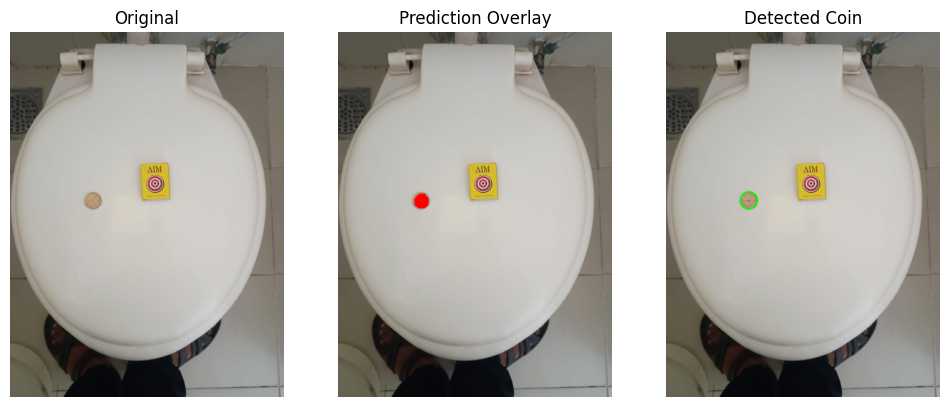

📏 Measured Properties
Pixel Radius: 30 px
Pixel Diameter: 60 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 66.30 px/in
Pixel per CM Ratio: 26.10 px/cm

Processing test79.jpg


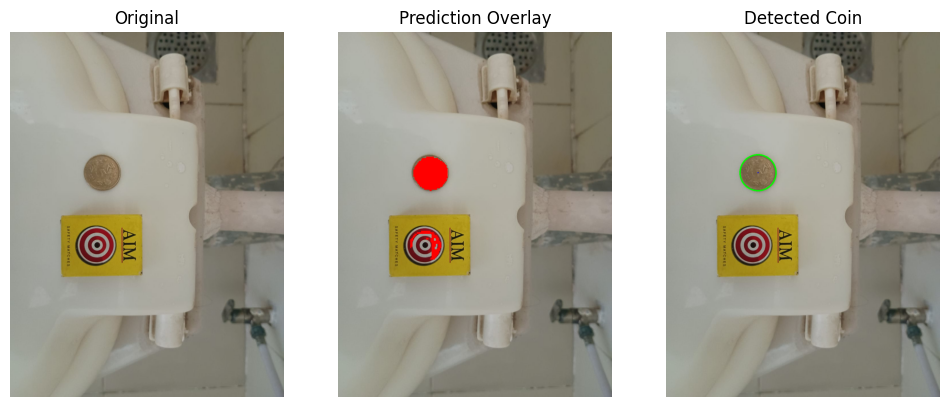

📏 Measured Properties
Pixel Radius: 63 px
Pixel Diameter: 126 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 139.23 px/in
Pixel per CM Ratio: 54.81 px/cm

Processing test8.jpg


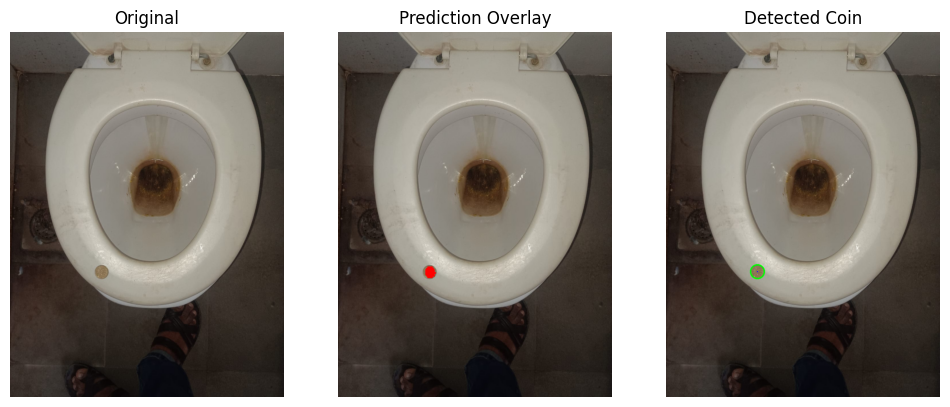

📏 Measured Properties
Pixel Radius: 24 px
Pixel Diameter: 48 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 53.04 px/in
Pixel per CM Ratio: 20.88 px/cm

Processing test9.jpg


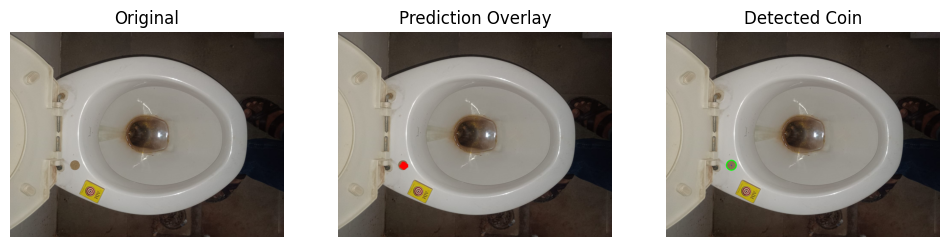

📏 Measured Properties
Pixel Radius: 23 px
Pixel Diameter: 46 px
Estimated Diameter (inches): 0.905 in
Estimated Diameter (cm): 2.299 cm
Pixel per Inch Ratio: 50.83 px/in
Pixel per CM Ratio: 20.01 px/cm



In [22]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
import os
from glob import glob
from PIL import Image

# ========================
# Setup device and config
# ========================
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()
model.to(DEVICE)

real_coin_diameter_inch = 0.905
real_coin_diameter_cm = real_coin_diameter_inch * 2.54

# ========================
# Folder path
# ========================
image_folder = "./5_coin/"  # change as needed
image_paths = sorted(glob(os.path.join(image_folder, "*.jpg")))

# ========================
# Process each image
# ========================
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

for test_path in image_paths:
    print(f"Processing {os.path.basename(test_path)}")

    # --- Load and preprocess image ---
    test_image = cv2.imread(test_path)
    test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
    resized = cv2.resize(test_image, (256, 256))
    input_tensor = transform(resized).unsqueeze(0).to(DEVICE)

    # --- Predict ---
    with torch.no_grad():
        output = model(input_tensor)
        pred = torch.sigmoid(output).squeeze().cpu().numpy()
        pred_mask = (pred > 0.5).astype(np.uint8) * 255

    # --- Resize mask to original size ---
    pred_mask_resized = cv2.resize(pred_mask, (test_image.shape[1], test_image.shape[0]))

    # --- Overlay mask on image ---
    overlay = test_image.copy()
    overlay[pred_mask_resized == 255] = [255, 0, 0]

    # --- Show prediction overlay ---
    plt.figure(figsize=(12, 12))
    plt.subplot(1, 3, 1)
    plt.imshow(test_image)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(overlay)
    plt.title("Prediction Overlay")
    plt.axis("off")

    # ========================
    # Coin Circle Measurement
    # ========================

    mask = pred_mask_resized

    # Threshold if it's not binary
    _, mask_bin = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

    # Find contours
    contours, _ = cv2.findContours(mask_bin, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        # Assume the largest contour is the coin
        contour = max(contours, key=cv2.contourArea)

        # Fit minimum enclosing circle
        (x, y), radius = cv2.minEnclosingCircle(contour)
        center = (int(x) - 2, int(y) - 2)
        radius = int(radius)

        # Draw result
        output = test_image.copy()
        cv2.circle(output, center, radius, (0, 255, 0), 4)
        cv2.circle(output, center, 2, (0, 0, 255), -1)

        # Show the result
        plt.subplot(1, 3, 3)
        plt.imshow(output)
        plt.title("Detected Coin")
        plt.axis("off")
        plt.show()

        # Create a single figure with 3 subplots
        fig, axs = plt.subplots(1, 3, figsize=(18, 6))

        axs[0].imshow(test_image)
        axs[0].set_title("Original")
        axs[0].axis("off")

        axs[1].imshow(overlay)
        axs[1].set_title("Prediction Overlay")
        axs[1].axis("off")

        axs[2].imshow(output)
        axs[2].set_title("Detected Coin")
        axs[2].axis("off")

        # Save the figure
        basename = os.path.basename(test_path)
        save_path = os.path.join("error", f"result_{basename}")
        plt.tight_layout()
        plt.savefig(save_path)
        plt.close(fig)  # Optional: free memory


        # Convert pixel radius to real-world units
        diameter_pixels = 2 * radius

        # Calculate ratios
        pixel_per_inch = diameter_pixels / real_coin_diameter_inch
        pixel_per_cm = diameter_pixels / real_coin_diameter_cm

        # Output values
        print("📏 Measured Properties")
        print(f"Pixel Radius: {radius} px")
        print(f"Pixel Diameter: {diameter_pixels} px")
        print(f"Estimated Diameter (inches): {real_coin_diameter_inch:.3f} in")
        print(f"Estimated Diameter (cm): {real_coin_diameter_cm:.3f} cm")
        print(f"Pixel per Inch Ratio: {pixel_per_inch:.2f} px/in")
        print(f"Pixel per CM Ratio: {pixel_per_cm:.2f} px/cm\n")

    else:
        print("⚠️ No circle could be fitted.\n")


In [ ]:
# --- 1. Imports ---
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt

# --- 2. Constants ---
IMG_DIR = '/content/images/'
MASK_DIR = '/content/marked/'  # red-marked overlay images

# --- 3. Red Line Extractor ---
def extract_red_lines(mask_img):
    hsv = cv2.cvtColor(mask_img, cv2.COLOR_RGB2HSV)
    lower_red2 = np.array([165, 100, 100])
    upper_red2 = np.array([180, 255, 255])
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
    return mask2  # returns binary mask (0 or 255)

# --- 4. Visualize Red Masks ---
images = [f for f in os.listdir(MASK_DIR) if f.endswith('.png')]

for mask_name in images:
    path = os.path.join(MASK_DIR, mask_name)
    marked = cv2.imread(path)
    marked = cv2.cvtColor(marked, cv2.COLOR_BGR2RGB)

    red_mask = extract_red_lines(marked)

    plt.figure(figsize=(6, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(red_mask, cmap='gray')
    plt.title(mask_name)
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(marked, cmap='gray')
    plt.title(mask_name)
    plt.axis('off')
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
!zip -r /content/result.zip /content/result
files.download('/content/result.zip')

  adding: content/result/ (stored 0%)
  adding: content/result/result_test41.jpg (deflated 16%)
  adding: content/result/result_test49.jpg (deflated 17%)
  adding: content/result/result_test76.jpg (deflated 17%)
  adding: content/result/result_test75.jpg (deflated 13%)
  adding: content/result/result_test62.jpg (deflated 14%)
  adding: content/result/result_test74.jpg (deflated 13%)
  adding: content/result/result_test21.jpg (deflated 15%)
  adding: content/result/result_test40.jpg (deflated 21%)
  adding: content/result/result_test25.jpg (deflated 21%)
  adding: content/result/result_test52.jpg (deflated 15%)
  adding: content/result/result_test77.jpg (deflated 17%)
  adding: content/result/result_test44.jpg (deflated 16%)
  adding: content/result/result_test47.jpg (deflated 16%)
  adding: content/result/result_test19.jpg (deflated 16%)
  adding: content/result/result_test20.jpg (deflated 16%)
  adding: content/result/result_test50.jpg (deflated 15%)
  adding: content/result/result_te

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>